<a href="https://colab.research.google.com/github/JayavardhaniKathika/Flixster/blob/master/FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 20 Newsgroups Data Load and Stopwords Extension

In [2]:
import re, numpy as np, pandas as pd
from pprint import pprint

# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.utils import lemmatize, simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

# NLTK Stop words
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [3]:
stop_words.extend(['about', 'above', 'after', 'again', 'against', 'ain', 'all','and', 'any', 'are', 'aren','because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'can', 'couldn','did', 'didn','does', 'doesn', 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for','from', 'further', 'had', 'hadn', 'has', 'hasn', 'have', 'haven', 'having','her', 'here',\
			'hers', 'herself', 'him', 'himself', 'his', 'how', 'into', 'isn', 'its', 'itself','just', 'mightn', 'more', 'most', 'mustn', 'myself', 'needn','nor', 'not', 'now', 'off', 'once', 'only',  'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own','same', 'shan', 'she', 'should', 'shouldn', 'some', 'such', 'than','that', 'the', 'their', 'theirs', 'them', 'themselves', 'then', 'there', 'these', 'they', 'this', 'those', 'through',\
			'too', 'under', 'until',  'very', 'was', 'wasn', "wasn't", 'were', 'weren', 'what', 'when', 'where','which', 'while', 'who', 'whom', 'why', 'will', 'with', 'won', "won't", 'wouldn', 'you',"you've", 'your', 'yours', 'yourself', 'yourselves', 'could','ought','would', 'able', 'abst', 'accordance', 'according', 'accordingly', 'across', 'act',\
			'actually', 'added', 'adj', 'affected', 'affecting', 'affects', 'afterwards', 'ah', 'almost', 'alone', 'along', 'already', 'also','nne','qfv','cis','owww','auis','epplyj','xtappmainloop','auis','aboutthisissue','seti','techsup','meyua','aaske','fcsc','epirb','iyo','noser','fijs','fdd','fpga','ppp','jahveh','tljby','plqs','cxt','cde','ghjn','dsco','tahnk','pcf','fhd','tbn','sol','ppp','fdd','bhjn','cjmelche','descibing','ayone',\
			'although', 'always', 'among', 'amongst', 'announce', 'another', 'anybody', 'anyhow', 'anymore', 'anyone', 'anything', 'anyway','dodnt','wkshtree','ina','gsxr','slrmc','stk','rgbre','poxy','yigal','siwvu','utrc''anyways', 'anywhere', 'apparently', 'approximately', 'arent', 'arise', 'around', 'aside', 'ask', 'asking', 'auth', 'available',\
			'away', 'awfully', 'back', 'became', 'become', 'becomes', 'becoming', 'beforehand', 'begin', 'beginning', 'beginnings', 'begins','behind', 'believe', 'beside', 'besides', 'beyond', 'biol', 'brief', 'briefly', 'came', 'cannot', "can't", 'cause', 'causes','mmanne','icomsim','uunet','ntsc'\
			'certain', 'certainly',  'com', 'come', 'comes', 'contain', 'containing', 'contains', 'couldnt', 'date', 'different', 'done','downwards', 'due', 'e', 'ed', 'edu', 'effect', 'eg', 'eight', 'eighty', 'either', 'else', 'elsewhere', 'end', 'ending', 'enough',\
			'especially', 'et', 'etc', 'even', 'ever', 'every', 'everybody', 'everyone', 'everything', 'everywhere', 'ex', 'except', 'f', 'far','ff', 'fifth', 'first', 'five', 'fix', 'followed', 'following', 'follows', 'former', 'formerly', 'forth', 'found', 'four', 'furthermore','g', 'gave', 'get', 'gets', 'getting', 'give', 'given', 'gives', 'giving', 'go', 'goes', 'gone', 'got', 'gotten','good', 'h', 'happens', 'hardly','hed', 'hence', 'hereafter', 'hereby', 'herein', 'heres', 'hereupon', 'hes', 'hi', 'hid', 'hither', 'home', 'howbeit', 'however', 'hundred','id', 'ie', 'im', 'immediate', 'immediately', 'importance', 'important', 'inc', 'indeed', 'index', 'information', 'instead', 'invention','inward', 'itd', "it'll", 'j', 'k', 'keep', 'keeps', 'kept', 'kg', 'km', 'know', 'known', 'knows', 'l', 'largely', 'last', 'lately', 'later','latter', 'latterly', 'least', 'less', 'lest', 'let', 'lets', 'like', 'liked', 'likely', 'line', 'little', "'ll", 'look', 'looking', 'looks',\
	    'ltd', 'made', 'mainly', 'make', 'makes', 'many', 'may', 'maybe', 'mean', 'means', 'meantime', 'meanwhile', 'merely', 'mg', 'might', 'million','miss', 'ml', 'moreover', 'mostly', 'mr', 'mrs', 'much', 'mug', 'must', 'n', 'na', 'name', 'namely', 'nay', 'nd', 'near', 'nearly', 'necessarily',\
			'necessary', 'need', 'needs', 'neither', 'never', 'nevertheless', 'new', 'next', 'nine', 'ninety', 'nobody', 'non', 'none', 'nonetheless','noone', 'normally', 'nos', 'noted', 'nothing', 'nowhere', 'obtain', 'obtained', 'obviously', 'often', 'oh', 'ok', 'okay', 'old', 'omitted',\
			'one', 'ones', 'onto', 'ord', 'others', 'otherwise', 'outside', 'overall', 'owing','page', 'pages', 'part', 'particular', 'particularly','past', 'per', 'perhaps', 'placed', 'please', 'plus', 'poorly', 'possible', 'possibly', 'potentially', 'pp', 'predominantly', 'present',\
			'previously', 'primarily', 'probably', 'promptly', 'proud', 'provides', 'put', 'q', 'que', 'quickly', 'quite', 'ran', 'rather','xputimage','ximage','integra''rd', 'readily', 'really', 'recent', 'recently', 'ref', 'refs', 'regarding', 'regardless', 'regards', 'related', 'relatively', 'research',\
			'respectively', 'resulted', 'resulting', 'results', 'right', 'run', 'said', 'saw', 'say', 'saying', 'says', 'sec', 'section', 'see', 'seeing','seem', 'seemed', 'seeming', 'seems', 'seen', 'self', 'selves', 'sent', 'seven', 'several', 'shall', 'shed', 'shes', 'show', 'showed', 'shown',\
			'showns', 'shows', 'significant', 'significantly', 'similar', 'similarly', 'since', 'six', 'slightly', 'somebody', 'somehow', 'someone','somethan', 'something', 'sometime', 'sometimes', 'somewhat', 'somewhere', 'soon', 'sorry', 'specifically', 'specified', 'specify', 'specifying',\
			'still', 'stop', 'strongly', 'sub', 'substantially', 'successfully', 'sufficiently', 'suggest', 'sup', 'sure', 'take', 'taken', 'taking','tell', 'tends', 'th', 'thank', 'thanks', 'thanx', 'thats', "that've", 'thence', 'thereafter', 'thereby', 'thered', 'therefore', 'therein',\
			"there'll", 'thereof', 'therere', 'theres', 'thereto', 'thereupon', "there've", 'theyd', 'theyre', 'think', 'thou', 'though', 'thoughh','thousand', 'throug', 'throughout', 'thru', 'thus', 'til', 'tip', 'together', 'took', 'toward', 'towards', 'tried', 'tries', 'truly', 'try',\
			'trying', 'ts', 'twice', 'two', 'u', 'un', 'unfortunately', 'unless', 'unlike', 'unlikely', 'unto', 'upon', 'ups', 'us', 'use', 'used', 'useful','usefully', 'usefulness', 'uses', 'using', 'usually', 'v', 'value', 'various', "'ve", 'via', 'viz', 'vol', 'vols', 'vs', 'w', 'want', 'wants',\
			'wasnt', 'way', 'wed', 'welcome', 'went', 'werent', 'whatever', "what'll", 'whats', 'whence', 'whenever', 'whereafter', 'whereas', 'whereby','wherein', 'wheres', 'whereupon', 'wherever', 'whether', 'whim', 'whither', 'whod', 'whoever', 'whole', "who'll", 'whomever', 'whos', 'whose',\
			'widely', 'willing', 'wish', 'within', 'without', 'wont', 'words', 'world', 'wouldnt', 'www', 'x', 'yes', 'yet', 'youd', 'youre', 'z', 'zero',"a's", "ain't", 'allow', 'allows', 'apart', 'appear', 'appreciate', 'appropriate', 'associated', 'best', 'better', "c'mon", "c's", 'cant',\
			'changes', 'clearly', 'concerning', 'consequently', 'consider', 'considering', 'corresponding', 'course', 'currently', 'definitely', 'described','despite', 'entirely', 'exactly', 'example', 'going', 'greetings', 'hello', 'help', 'hopefully', 'ignored', 'inasmuch', 'indicate', 'indicated',\
			'indicates', 'inner', 'insofar', "it'd", 'keep', 'keeps', 'novel', 'presumably', 'reasonably', 'second', 'secondly', 'sensible', 'serious','seriously', 'sure', "t's", 'third', 'thorough', 'thoroughly', 'three', 'well', 'wonder', 'a', 'about', 'above', 'above', 'across', 'after',\
			'afterwards', 'again', 'against', 'all', 'almost', 'alone', 'along', 'already', 'also', 'although', 'always', 'am', 'among', 'amongst','amoungst', 'amount', 'an', 'and', 'another', 'any', 'anyhow', 'anyone', 'anything', 'anyway', 'anywhere', 'are', 'around', 'as', 'at',\
			'back', 'be', 'became', 'because', 'become', 'becomes', 'becoming', 'been', 'before', 'beforehand', 'behind', 'being', 'below', 'beside','besides', 'between', 'beyond', 'bill', 'both', 'bottom', 'but', 'by', 'call', 'can', 'cannot', 'cant', 'co', 'con', 'could', 'couldnt',\
			'cry', 'de', 'describe', 'detail', 'do', 'done', 'down', 'due', 'during', 'each', 'eg', 'eight', 'either', 'eleven', 'else', 'elsewhere','empty', 'enough', 'etc', 'even', 'ever', 'every', 'everyone', 'everything', 'everywhere', 'except', 'few', 'fifteen', 'fify', 'fill', 'find',\
			'fire', 'first', 'five', 'for', 'former', 'formerly', 'forty', 'found', 'four', 'from', 'front', 'full', 'further', 'get', 'give', 'go', 'had','has', 'hasnt', 'have', 'he', 'hence', 'her', 'here', 'hereafter', 'hereby', 'herein', 'hereupon', 'hers', 'herself', 'him', 'himself', 'his','how', 'however', 'hundred', 'ie', 'if', 'in', 'inc', 'indeed', 'interest', 'into', 'is', 'it', 'its', 'itself', 'keep', 'last', 'latter',\
			'latterly', 'least', 'less', 'ltd', 'made', 'many', 'may', 'me', 'meanwhile', 'might', 'mill', 'mine', 'more', 'moreover', 'most', 'mostly','move', 'much', 'must', 'my', 'myself', 'name', 'namely', 'neither', 'never', 'nevertheless', 'next', 'nine', 'no', 'nobody', 'none', 'noone',\
			'nor', 'not', 'nothing', 'now', 'nowhere', 'of', 'off', 'often', 'on', 'once', 'one', 'only', 'onto', 'or', 'other', 'others', 'otherwise','our', 'ours', 'ourselves', 'out', 'over', 'own', 'part', 'per', 'perhaps', 'please', 'put', 'rather', 're', 'same', 'see', 'seem', 'seemed',\
			'seeming', 'seems', 'serious', 'several', 'she', 'should', 'show', 'side', 'since', 'sincere', 'six', 'sixty', 'so', 'some', 'somehow', 'someone','something', 'sometime', 'sometimes', 'somewhere', 'still', 'such', 'system', 'take', 'ten', 'than', 'that', 'the', 'their', 'them', 'themselves','then', 'thence', 'there', 'thereafter', 'thereby', 'therefore', 'therein', 'thereupon', 'these', 'they', 'thickv', 'thin', 'third', 'this','those', 'though', 'three', 'through', 'throughout', 'thru', 'thus', 'to', 'together', 'too', 'top', 'toward', 'towards', 'twelve', 'twenty','time',\
			'two', 'un', 'under', 'until', 'up', 'upon', 'us', 'very', 'via', 'was', 'we', 'well', 'were', 'what', 'whatever', 'when', 'whence', 'whenever','where', 'whereafter', 'whereas', 'whereby', 'wherein', 'whereupon', 'wherever', 'whether', 'which', 'while', 'whither', 'who', 'whoever',\
			'whole', 'whom', 'whose', 'why', 'will', 'with', 'within', 'without', 'would', 'yet', 'you', 'your', 'yours', 'yourself', 'yourselves', 'the','research-articl', 'pagecount', 'cit', 'ibid', 'les', 'que', 'est', 'pas', 'vol', 'el', 'los', 'pp', 'u201d', 'well-b','espn'\
			'volumtype', 'par', 'its', 'mightnt', 'mustnt', 'neednt', 'shant', 'shes', 'shouldve', 'shouldnt', 'thatll', 'wasnt', 'werent', 'wont', 'wouldnt', 'youd','youll', 'youre', 'youve', 'hed', 'hell', 'hes', 'heres', 'hows', 'id', 'ill', 'im', 'ive', 'lets', 'shed', 'shell', 'thats', 'theres',\
			'theyd', 'theyll', 'theyre', 'theyve', 'wed', 'well', 'were', 'weve', 'whats', 'whens', 'wheres', 'whos', 'whys', 'cant', 'itll', 'll','thatve', 'therell', 'thereve', 've', 'whatll', 'wholl', 'as', 'aint', 'cmon', 'cs', 'itd', 'ts', 'researcharticl', 'wellb','qax','fij','vga','imho','cfv','leos','escrowe'\
			'hst','mbf','nuy','fpl','fyn','bhj','nrhj','tct','vmk','gizw','ndetloopc','vfq','netcomcom','rax','gizw','mgvgvgvgvgvgvgvgvgvgvgvgvgvgvgv','qqf','nriz','kjz','ahf','bbs',\
      'cdi','utica','dpy','lut','adl','sdtr','iifx','cdn','ops','ben','do','pt','meg','rfcs','lambros','xxx','longo','lynn','yovtis','odlyzko','elsevier','shafi','acm','siam','fips',\
      'afips','menezes','vanstone','dod','rfc','tib','adb','keysym','ayari','belorusskaya','fps','mwm','simms','awd','cvo','ktvb','nbc','fbi','viki','counterblockade','pne','pnie',\
      'wwiz','mhz','libxmu','cfc','tla','tnvt','sysvr','nezhdeh','otg','mkh','cbo','apalle','lhzack','eft','arsenokoitein','reentere','technojunkie','ebcin','nmea','twounit','tzatziki',\
      'rtmessage','ezekial','qvt','xvttool','duco','irgun','msfc','dfi','sgot','thewho','xxxx','xvs','ihrv','bse','lesreeve','shos','tas','tijuana','realpolitik'])



In [4]:
import warnings
def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

In [5]:
import nltk
nltk.download('punkt')
from sklearn.datasets import fetch_20newsgroups
newsgroups = fetch_20newsgroups(shuffle=False, subset='all', remove=('headers', 'footers', 'quotes'))

#find length of targets in all data
print(len(newsgroups.filenames))                           

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


18846


#Q1 - Preprocess 20 Newsgroup dataset and visualize its statistical information.

https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/

In [6]:
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent) 

In [7]:
data_words = list(sent_to_words(newsgroups.data))

In [8]:
print(data_words[:1])

[['morgan', 'and', 'guzman', 'will', 'have', 'eras', 'run', 'higher', 'than', 'last', 'year', 'and', 'the', 'cubs', 'will', 'be', 'idiots', 'and', 'not', 'pitch', 'harkey', 'as', 'much', 'as', 'hibbard', 'castillo', 'wont', 'be', 'good', 'think', 'hes', 'stud', 'pitcher']]


In [9]:
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts_out = []
    nlp = spacy.load('en', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words and len(word)>2 and word.isalpha()] for doc in texts_out]    
    return texts_out

corpus = process_words(data_words)  # processed Text Data!


In [10]:
corpusWithSentences=[]
for doc in corpus:
  document=' '.join(doc)
  corpusWithSentences.append(document)

In [11]:
uniqueWords=set()
words=[]
for i in range(0,len(corpus)):
  sen=corpus[i]
  for word in sen:
    uniqueWords.add(word)
    words.append(word)

In [12]:
print('Number of Documents: '+str(len(newsgroups.data) ))
print('Number of sentences: '+ str(len(corpusWithSentences)))
print('Number of words: '+ str(len(words)))
print('Number of unique words: '+str(len(uniqueWords)))
meanOfWordsPerSentence=(len(words)/len(corpusWithSentences))
print("Mean of Number of words per sentence:"+str(meanOfWordsPerSentence))

Number of Documents: 18846
Number of sentences: 18846
Number of words: 899900
Number of unique words: 39533
Mean of Number of words per sentence:47.75018571580176


In [13]:
corpus[:1]

[['era', 'high', 'year', 'cub', 'idiot', 'pitcher']]

In [14]:
corpusWithSentences[:1]

['era high year cub idiot pitcher']

#Q2- Build two different vocabularies upon different preprocessing ways; Learn Bag-of-words (BoW) and TF-IDF model with each vocabulary accordingly.

#BOW on all Vocabulary

https://radimrehurek.com/gensim/auto_examples/howtos/run_compare_lda.html

In [15]:
#Vocabulary with all unique words
import gensim as gm
from gensim.corpora import Dictionary
vocabulary_alldata = gm.corpora.Dictionary(corpus)

#Bag of Words with all unique words vocabulary
BOW_alldata = [vocabulary_alldata.doc2bow(doc) for doc in corpus] 

In [16]:
for doc in BOW_alldata[0:4]:
    print(doc)
len(BOW_alldata)

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]
[(2, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 2), (26, 3), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 2), (33, 1), (34, 2), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 2), (43, 1), (44, 1), (45, 3), (46, 1), (47, 1), (48, 1), (49, 1), (50, 3), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1)]
[(5, 1), (17, 11), (29, 1), (31, 2), (41, 4), (45, 2), (61, 3), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 3), (74, 1), (75, 1), (76, 1), (77, 4), (78, 2), (79, 1), (80, 1), (81, 1), (82, 1), (83, 4), (84, 1), (85, 1), (86, 3), (87, 1), (88, 1), (89, 1), (90, 1), (91, 1), (92, 4), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 3), (99, 1), (100, 1), (101, 1), (102, 1), (103, 

18846

#BOW on top 2000 high frequency words

https://radimrehurek.com/gensim/auto_examples/howtos/run_compare_lda.html

In [17]:
#Vocabulary with first 2000 unique words
import gensim as gm
from gensim.corpora import Dictionary
vocabulary_somedata= gm.corpora.Dictionary(corpus) #dictionary with all data
vocabulary_somedata.filter_extremes(keep_n=2000)

#Bag of Words with 2000 unique words vacabulary
BOW_somedata = [vocabulary_somedata.doc2bow(doc) for doc in corpus] 

#TFIDF on all Vocabulary

In [18]:
#tdidf for all unqiue words
from gensim import models
tfidf1= models.TfidfModel(BOW_alldata)
tfidf_alldata = tfidf1[BOW_alldata]

In [19]:
for doc in tfidf_alldata:
    print(doc)
    break
len(tfidf_alldata)

[(0, 0.5669347994814519), (1, 0.4694137596117161), (2, 0.22166572464244197), (3, 0.4664980870452124), (4, 0.4014840604653886), (5, 0.17404035715385932)]


18846

#TFIDF on top 2000 high frequency words

In [20]:
from gensim import models
tfidf2= models.TfidfModel(BOW_somedata)
tfidf_somedata = tfidf2[BOW_somedata]

In [21]:
for doc in tfidf_somedata:
    print(doc)
    break
len(tfidf_somedata)

[(0, 0.45189446751190304), (1, 0.8184775792972806), (2, 0.3548039492731124)]


18846

#Q3- Train two LDA models upon the vocabularies in Step 2; Visualize topics with at least two different methods; and eventually get the topic distribution (as features) for each document.

#LDA model on all vocabulary

In [22]:
#Lda model on BOW for all data
from gensim.models import LdaMulticore
lda_model_all = LdaMulticore(corpus=BOW_alldata, num_topics=20, id2word=vocabulary_alldata, workers=4, passes=20)

In [ ]:
lda_model_all.print_topics()  

[(0,
  '0.018*"key" + 0.011*"chip" + 0.008*"space" + 0.006*"bit" + 0.006*"encryption" + 0.006*"phone" + 0.006*"datum" + 0.006*"clipper" + 0.006*"number" + 0.005*"planet"'),
 (1,
  '0.020*"people" + 0.007*"thing" + 0.007*"law" + 0.007*"point" + 0.007*"man" + 0.006*"sin" + 0.006*"life" + 0.006*"child" + 0.006*"homosexual" + 0.005*"fact"'),
 (2,
  '0.011*"car" + 0.010*"speed" + 0.010*"engine" + 0.006*"small" + 0.005*"frame" + 0.005*"work" + 0.005*"seat" + 0.005*"big" + 0.005*"shift" + 0.004*"movie"'),
 (3,
  '0.018*"post" + 0.016*"people" + 0.015*"question" + 0.011*"work" + 0.010*"problem" + 0.010*"group" + 0.009*"answer" + 0.007*"thing" + 0.007*"mail" + 0.007*"computer"'),
 (4,
  '0.020*"gun" + 0.010*"claim" + 0.008*"exist" + 0.008*"evidence" + 0.008*"people" + 0.008*"true" + 0.006*"argument" + 0.006*"statement" + 0.006*"point" + 0.006*"thing"'),
 (5,
  '0.010*"thing" + 0.010*"year" + 0.009*"ride" + 0.009*"point" + 0.009*"day" + 0.008*"gamma" + 0.007*"define" + 0.007*"plane" + 0.007*"bra

In [ ]:
#Print topics of LDA model
import pandas as pd;
def get_lda_topics(model, num_topics):
    word_dict = {};
    for i in range(num_topics):
        words = model.show_topic(i, topn = 30);
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = [i[0] for i in words];
    return pd.DataFrame(word_dict);

In [ ]:
get_lda_topics(lda_model_all, 20)

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10,Topic # 11,Topic # 12,Topic # 13,Topic # 14,Topic # 15,Topic # 16,Topic # 17,Topic # 18,Topic # 19,Topic # 20
0,key,people,car,post,gun,thing,food,max,government,people,lose,slip,file,hit,window,love,game,drive,car,power
1,chip,thing,speed,people,claim,year,eat,pit,year,government,thing,phone,image,year,problem,people,team,price,bike,battery
2,space,law,engine,question,exist,ride,feel,shot,drug,kill,wire,fat,program,pitch,card,church,year,sell,light,high
3,bit,point,small,work,evidence,point,people,period,patient,armenian,body,packet,format,pitcher,work,prayer,play,buy,lock,low
4,encryption,man,frame,problem,people,day,gas,lead,number,child,problem,model,version,player,file,pray,player,offer,ride,sound
5,phone,sin,work,group,true,gamma,study,goal,public,start,word,dial,color,book,support,god,win,work,start,heat
6,datum,life,seat,answer,argument,define,year,save,rate,turkish,ground,slipper,list,clutch,driver,man,season,sale,buy,problem
7,clipper,child,big,thing,statement,plane,homosexuality,chronic,health,year,tradition,muscle,graphic,larson,disk,speak,fan,mail,change,output
8,number,homosexual,shift,mail,point,brake,term,jet,increase,leave,people,baptism,include,average,software,day,score,card,oil,water
9,planet,fact,movie,computer,thing,tire,claim,tor,doctor,happen,list,baptize,mail,fuel,application,teach,watch,disk,turn,energy


#LDA model on 2000 vocabulary

In [ ]:
#Lda model on BOW for some data (2000 vocabulary)
from gensim.models import LdaMulticore
lda_model_some = LdaMulticore(corpus=BOW_somedata, num_topics=20, id2word=vocabulary_somedata, workers=4, passes=20)

In [ ]:
get_lda_topics(lda_model_some, 20)

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10,Topic # 11,Topic # 12,Topic # 13,Topic # 14,Topic # 15,Topic # 16,Topic # 17,Topic # 18,Topic # 19,Topic # 20
0,book,game,space,gun,car,government,post,key,card,player,people,child,drive,file,power,image,file,people,work,window
1,offer,lose,launch,people,buy,law,mail,chip,driver,year,thing,people,speed,program,problem,file,disk,armenian,question,application
2,include,watch,planet,state,sell,people,list,phone,monitor,team,point,day,scsi,entry,battery,format,problem,kill,talk,server
3,black,play,orbit,year,price,police,send,encryption,software,hit,man,year,hard,include,turn,color,copy,turkish,people,font
4,price,team,earth,number,engine,gun,address,clipper,port,play,claim,patient,problem,output,ground,graphic,program,jewish,job,display
5,cover,fan,mission,public,cost,weapon,message,government,work,game,religion,woman,disk,error,high,program,software,war,decision,manager
6,sale,thing,solar,rate,year,state,article,bit,video,score,true,doctor,work,build,wire,version,hard,government,involve,program
7,copy,guy,spacecraft,israeli,pay,case,group,number,high,win,question,start,fast,define,thing,bit,machine,attack,program,support
8,paper,year,satellite,care,money,agent,email,security,support,goal,church,hear,tape,write,heat,software,work,village,support,problem
9,original,flame,year,country,work,legal,read,secure,computer,point,love,thing,bus,function,energy,package,memory,man,project,work



https://www.tutorialspoint.com/gensim/gensim_creating_tf_idf_matrix.htm 

https://www.kaggle.com/sumantindurkhya/topic-modeling-on-20-newsgroup-data-lsa-and-lda

#Visualizing Topics

https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/



#Visualizing Topics using pyLDAVis

#pyLDAVis on all data

In [ ]:
pip install pyLDAvis

     |████████████████████████████████| 1.6MB 3.5MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97711 sha256=14609aeaca8c964e28fbd7e79ae569e903e79b377056b4104aa0ca99905d5acb
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis


In [ ]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis_alldata = pyLDAvis.gensim.prepare(lda_model_all, BOW_alldata, vocabulary_alldata)
vis_alldata

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.100953 -0.107740       1        1  13.184264
1     -0.127969 -0.173931       2        1  11.571077
12     0.214667 -0.077904       3        1  10.397490
14     0.250391 -0.032067       4        1   7.648286
0      0.117276 -0.014708       5        1   7.643932
8     -0.006730 -0.089194       6        1   6.631423
4     -0.070166 -0.123933       7        1   5.400425
17     0.210274  0.025924       8        1   5.008284
3     -0.010352 -0.106103       9        1   4.704370
16    -0.059356  0.056880      10        1   4.425553
19     0.093473  0.067287      11        1   3.680983
2      0.029514  0.086399      12        1   2.875085
15    -0.130540 -0.084229      13        1   2.782240
18     0.036988  0.089727      14        1   2.740962
13    -0.043009  0.046283      15        1   2.721294
10    -0.081997 -0.038187      16        1   2.647516
6     -0.092062 -0.028651      17        1   2.230425
5     -0.050178  0.116802      18        1   1.620459
7     -0.117136  0.293259      19        1   1.298267
11    -0.062134  0.094087      20        1   0.787663, topic_info=         Term         Freq        Total Category  logprob  loglift
546       max  2487.000000  2487.000000  Default  30.0000  30.0000
154      file  3888.000000  3888.000000  Default  29.0000  29.0000
494      game  1657.000000  1657.000000  Default  28.0000  28.0000
1746    image  2532.000000  2532.000000  Default  27.0000  27.0000
25      drive  2065.000000  2065.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
1191  picture    21.023808   422.768830  Topic20  -5.8205   1.8427
35       hear    22.208053  1571.995622  Topic20  -5.7658   0.5842
386     stuff    21.129515   956.171817  Topic20  -5.8155   1.0316
465      cost    20.537525  1047.173227  Topic20  -5.8440   0.9123
441      work    21.991089  4178.282546  Topic20  -5.7756  -0.4032

[1533 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
12412      7  0.926426   abiding
2872       2  0.174784  absolute
2872       3  0.069914  absolute
2872       7  0.710790  absolute
2872      15  0.040783  absolute
...      ...       ...       ...
3738      13  0.021508    yellow
3738      14  0.752790    yellow
3738      15  0.043017    yellow
3738      17  0.021508    yellow
38689     20  0.789359   yodicet

[6499 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 2, 13, 15, 1, 9, 5, 18, 4, 17, 20, 3, 16, 19, 14, 11, 7, 6, 8, 12])

#pyLDAVis on 2000 vocabularies

In [ ]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis_somedata = pyLDAvis.gensim.prepare(lda_model_some, BOW_somedata, vocabulary_somedata)
vis_somedata

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
10    -0.131344 -0.096717       1        1  13.767610
11    -0.153668  0.040967       2        1   7.182662
15     0.191013 -0.068795       3        1   6.218200
3     -0.148020 -0.087714       4        1   5.974946
17    -0.193001 -0.080153       5        1   5.923401
18    -0.098206 -0.083336       6        1   5.654281
5     -0.165880 -0.131259       7        1   5.359324
4     -0.010395  0.186070       8        1   5.195029
6      0.090405 -0.128007       9        1   4.885521
19     0.218103 -0.094371      10        1   4.733280
8      0.205573  0.092274      11        1   4.429067
14     0.004793  0.117500      12        1   4.406552
7     -0.012625 -0.097399      13        1   4.112936
1     -0.160119  0.147220      14        1   4.100458
2     -0.050843  0.041992      15        1   3.795031
9     -0.130028  0.123790      16        1   3.591164
13     0.149327 -0.127770      17        1   2.977314
12     0.142934  0.109282      18        1   2.782695
0      0.067429  0.155941      19        1   2.492500
16     0.184551 -0.019517      20        1   2.418028, topic_info=            Term         Freq        Total Category  logprob  loglift
99          file  3996.000000  3996.000000  Default  30.0000  30.0000
15         drive  2198.000000  2198.000000  Default  29.0000  29.0000
977        image  2264.000000  2264.000000  Default  28.0000  28.0000
263       window  2061.000000  2061.000000  Default  27.0000  27.0000
112          key  1761.000000  1761.000000  Default  26.0000  26.0000
..           ...          ...          ...      ...      ...      ...
263       window   113.322407  2061.272877  Topic20  -4.9572   0.8214
231        write   112.961425  2092.852991  Topic20  -4.9604   0.8030
55   application   100.549003  1264.643900  Topic20  -5.0768   1.1903
383        check    91.935819  1046.143118  Topic20  -5.1664   1.2904
341        thing   101.775483  3472.572881  Topic20  -5.0647   0.1923

[1043 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1166      1  0.133873      abuse
1166      2  0.075982      abuse
1166      4  0.032564      abuse
1166      7  0.640420      abuse
1166      8  0.007236      abuse
...     ...       ...        ...
47        6  0.681603  yesterday
47        8  0.017843  yesterday
47       11  0.074941  yesterday
47       14  0.074941  yesterday
47       18  0.017843  yesterday

[6445 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 12, 16, 4, 18, 19, 6, 5, 7, 20, 9, 15, 8, 2, 3, 10, 14, 13, 1, 17])

#Word Cloud Visualization -
https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/

#Word Cloud Visualization on all data

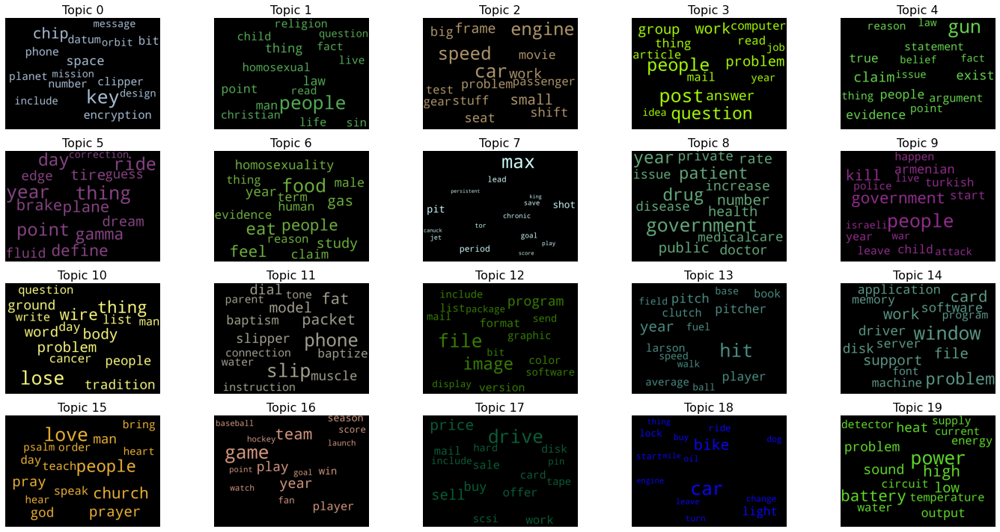

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.XKCD_COLORS.items()]
        #TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='black',
                  width=2500,
                  height=1800,
                  max_words=15,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model_all.show_topics(formatted=False, num_topics=20, num_words=15)

fig, axes = plt.subplots(4, 5, figsize=(20,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')
plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

#Word cloud visualization on 2000 vocabularies

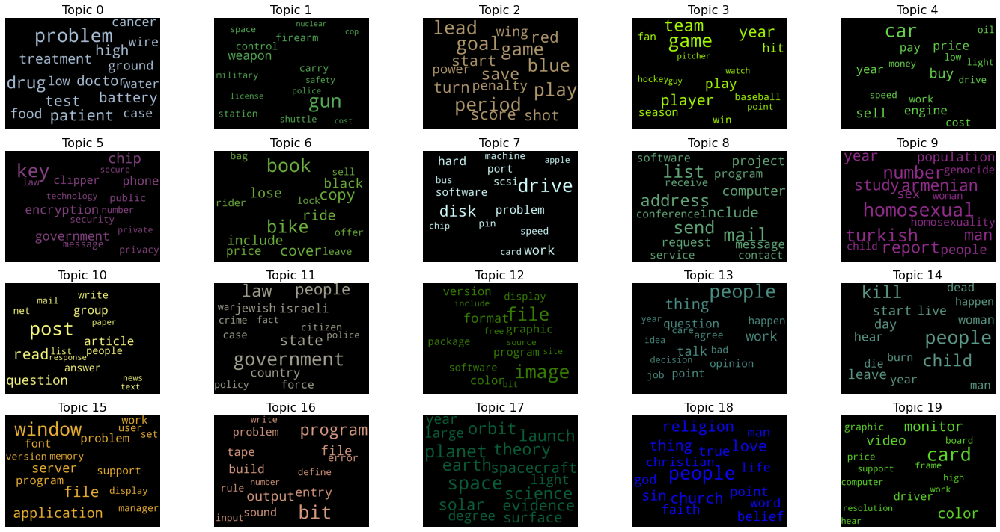

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.XKCD_COLORS.items()]
        
cloud = WordCloud(stopwords=stop_words,background_color='black',
                  width=2500,height=1800,max_words=15,colormap='tab10',color_func=lambda *args, **kwargs: cols[i],prefer_horizontal=1.0)

topics = lda_model_some.show_topics(formatted=False, num_topics=20, num_words=15)

fig, axes = plt.subplots(4, 5, figsize=(20,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')
plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

#Q4 - Train two Doc2Vec models upon the vocabularies in Step 2; Visualize your learned word and document embedding space; Collect Doc2Vec representation of each document.

#Word2Vec

In [23]:
from gensim.models import Word2Vec
# define training data
# train model
word2vec_model_alldata = Word2Vec(corpus, min_count=1)

In [24]:
word2vec_model_somedata=word2vec_model_alldata.wv.index2entity[:2000]

#Visualization of word embeddings

#Word Embeddings on some data with PCA -
https://machinelearningmastery.com/develop-word-embeddings-python-gensim/

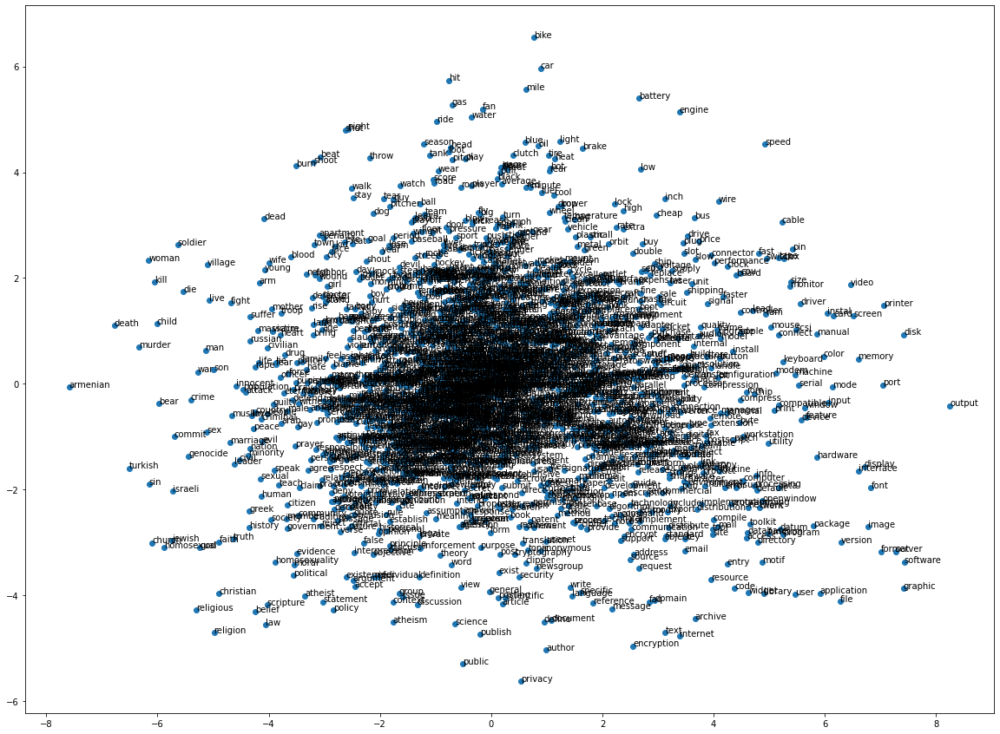

In [25]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as pyplot
from sklearn.decomposition import PCA
import warnings

cols = [color for name, color in mcolors.XKCD_COLORS.items()]

d={}
for i in range(0,2000):
  d[word2vec_model_somedata[i]] = word2vec_model_alldata[word2vec_model_somedata[i]]
p=word2vec_model_alldata[d]

pca = PCA(n_components=2)
result = pca.fit_transform(p)
pyplot.figure(figsize=(20, 15))
pyplot.scatter(result[:, 0], result[:, 1])
words = list(word2vec_model_somedata)
import warnings
def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()
for i, word in enumerate(words):
	pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

#Word Embeddings on all data with PCA

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  after removing the cwd from sys.path.


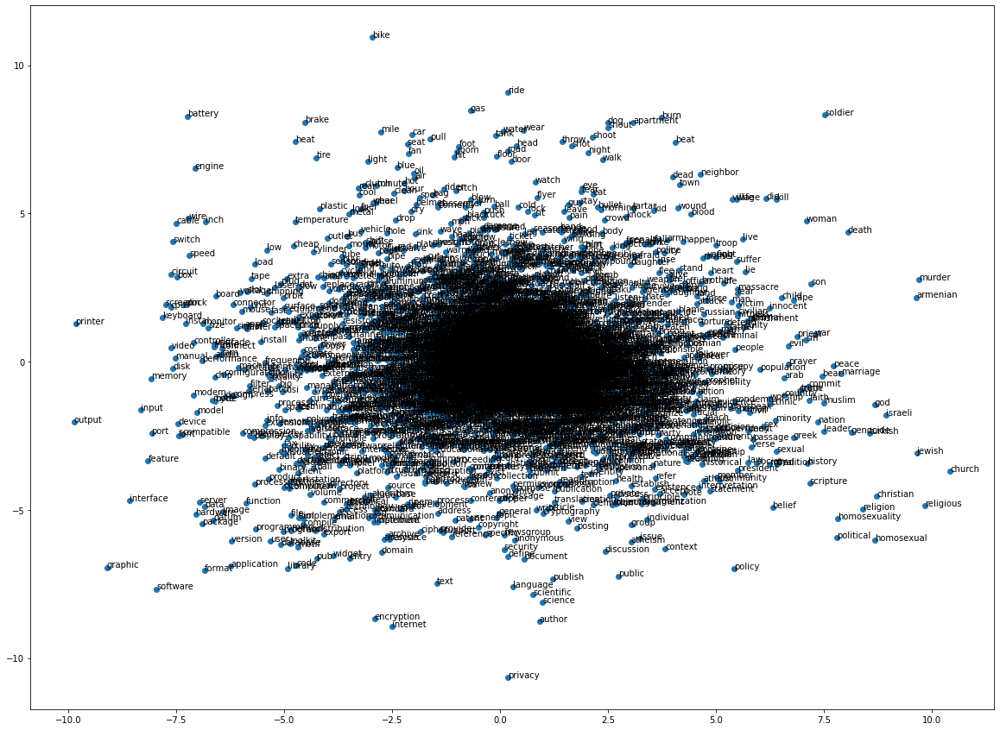

In [ ]:
from sklearn.decomposition import PCA
from matplotlib import pyplot
word2vec_model_alldata = Word2Vec(corpus, size=100, window=20, min_count=20, workers=4)
X = word2vec_model_alldata[word2vec_model_alldata.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
pyplot.figure(figsize=(20, 15))
pyplot.scatter(result[:, 0], result[:, 1])
words = list(word2vec_model_alldata.wv.vocab)
for i, word in enumerate(words):
	pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

#TSNE word embeddings on all data -
https://www.kaggle.com/jeffd23/visualizing-word-vectors-with-t-sne

In [ ]:
#word2vec_model_alldata
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path wh

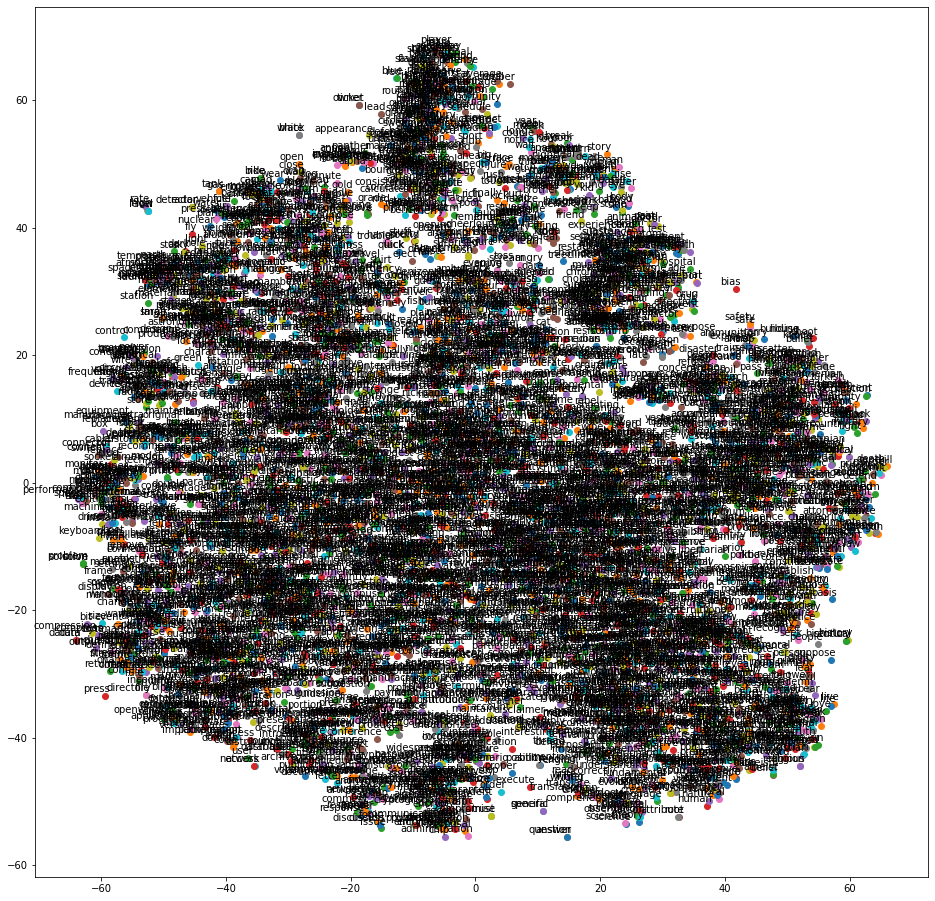

In [ ]:
tsne_plot(word2vec_model_alldata)

#TSNE plot on all data by only plotting some words for clear understanding

In [ ]:
from matplotlib import pyplot as plt
from gensim.models import Word2Vec
word2vec_model2 = Word2Vec(corpus, size=100, window=20, min_count=1000, workers=4)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-pa

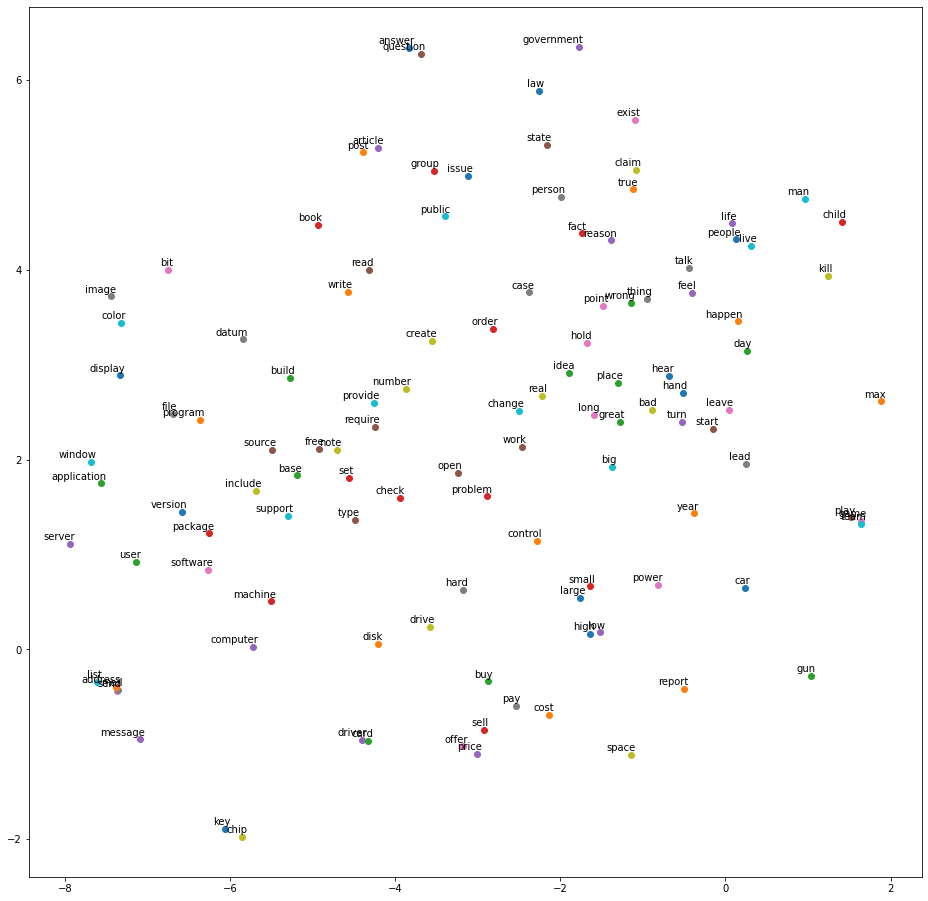

In [ ]:
tsne_plot(word2vec_model2)

#TSNE on 2000 vocabulary

In [ ]:
from gensim.models import Word2Vec
# define training data
# train model
word2vec_model_alldata = Word2Vec(corpus, min_count=1)
#word2vec_model_alldata=Word2Vec(corpus, size=100, window=20, min_count=1000, workers=4)
word2vec_model_somedata=word2vec_model_alldata.wv.index2entity[:2000]
d={}
for i in range(0,2000):
  d[word2vec_model_somedata[i]] = word2vec_model_alldata[word2vec_model_somedata[i]]

In [ ]:
#word2vec_model_somedata
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
def tsne_plot_s(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    
    # labels1 = []
    # tokens1 = []
    items = d.items() 
    for item in items: 
      labels.append(item[0]), tokens.append(item[1])
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

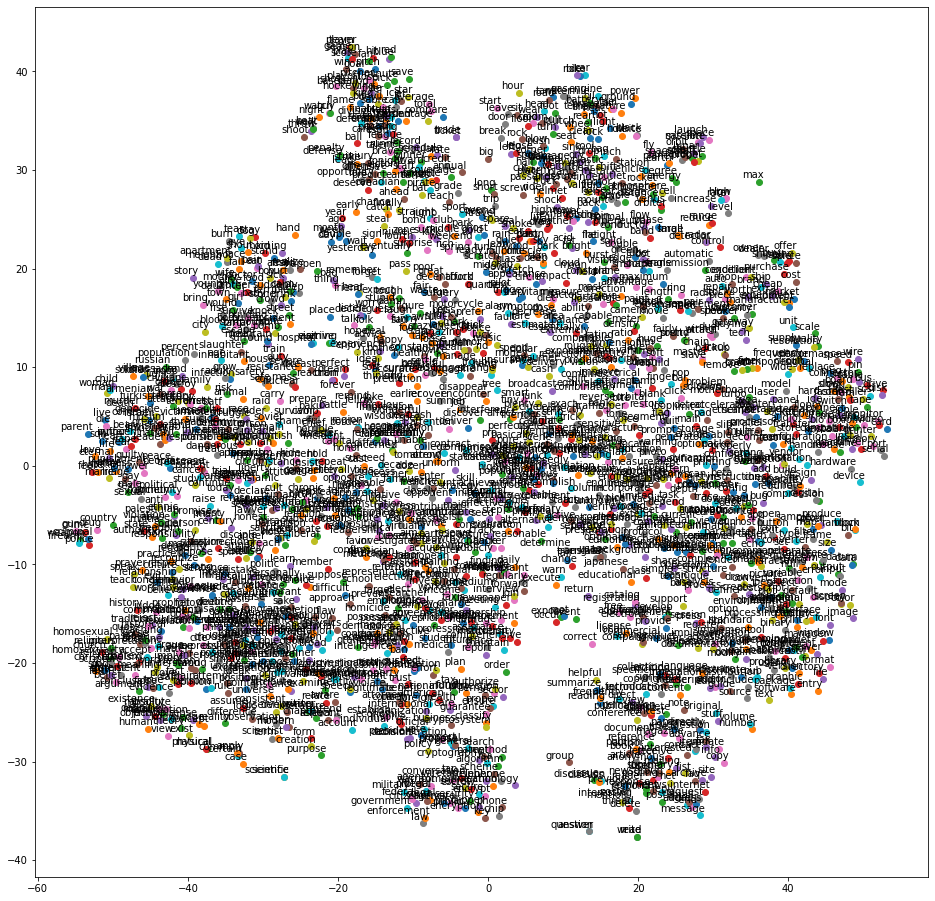

In [ ]:
tsne_plot_s(d)

#Doc2Vec -
https://www.kaggle.com/arthurtok/target-visualization-t-sne-and-doc2vec

#DOC2vec on all data

In [ ]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

doc2vec_alldata = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus)]
doc2vec_model_alldata = Doc2Vec(window=5, min_count=1, workers=4)
doc2vec_model_alldata.build_vocab(doc2vec_alldata)
doc2vec_model_alldata.train(doc2vec_alldata, total_examples=len(doc2vec_alldata), epochs=10)

#Doc2Vec on some data

In [ ]:
doc2vec_somedata = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus)]
doc2vec_model_somedata = Doc2Vec(window=7, min_count=127, workers=4)
doc2vec_model_somedata.build_vocab(doc2vec_somedata)
doc2vec_model_somedata.train(doc2vec_somedata, total_examples=len(doc2vec_somedata), epochs=50)

#Document Embeddings on all data using TSNE

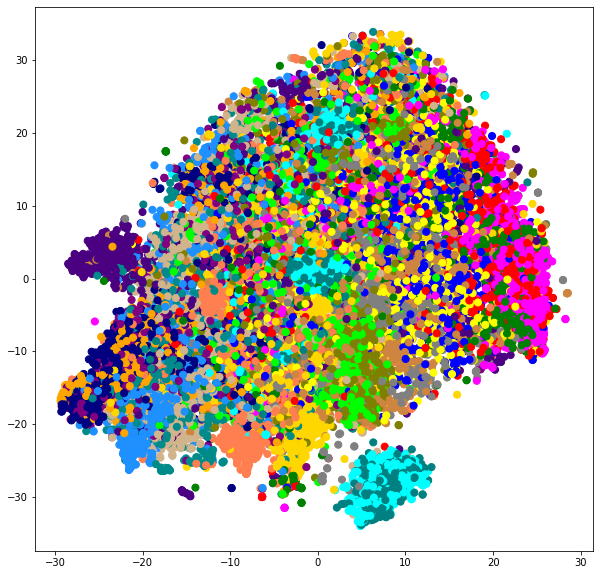

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import pandas as pd

tsne = TSNE(n_components=2, n_iter=4000, perplexity=200.0, early_exaggeration=20.0)
tsne_d2v = tsne.fit_transform(doc2vec_model_alldata.docvecs.vectors_docs)
tsne_d2v_df = pd.DataFrame(data=tsne_d2v, columns=["x", "y"]) 
%matplotlib inline
plt.figure
D2V_alldata_labels=newsgroups.target
label1 = ['orange', 'green', 'red', 'blue','yellow','magenta','gray','olive','lime','teal','cyan','indigo','peru','coral','gold','navy','tan','dodgerblue','darkcyan','purple']
color = [label1[i] for i in D2V_alldata_labels]
label2=['cluster1','cluster2','cluster3','cluster4','cluster5','cluster6','cluster7','cluster8','cluster9','cluster10','cluster11','cluster12','cluster13','cluster14','cluster15','cluster16','cluster17','cluster18','cluster19','cluster20']
label = [label2[i] for i in D2V_alldata_labels]
plt.figure(figsize=(10,10))
plt.scatter(tsne_d2v[:, 0], tsne_d2v[:, 1], c=color,s=50,label=label)
#plt.legend()
plt.show()


#Document Embeddings on some data using TSNE

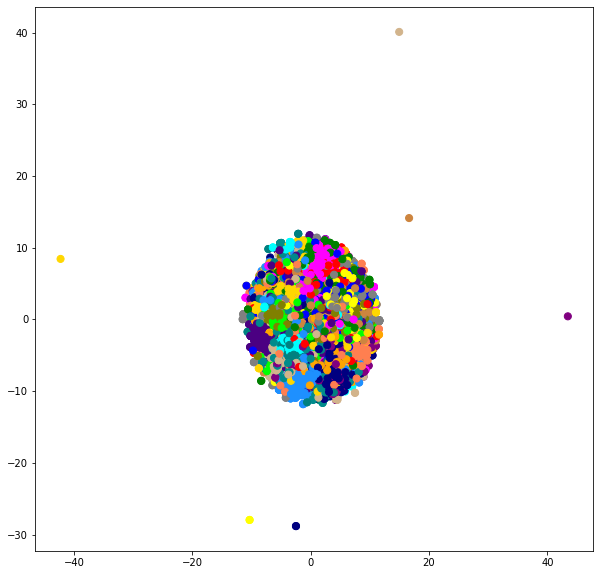

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import pandas as pd

tsne = TSNE(n_components=2, n_iter=4000, perplexity=200.0, early_exaggeration=20.0)
tsne_d2v = tsne.fit_transform(doc2vec_model_somedata.docvecs.vectors_docs)
tsne_d2v_df = pd.DataFrame(data=tsne_d2v, columns=["x", "y"]) 

D2V_somedata_labels=newsgroups.target
%matplotlib inline
plt.figure
label1 = ['orange', 'green', 'red', 'blue','yellow','magenta','gray','olive','lime','teal','cyan','indigo','peru','coral','gold','navy','tan','dodgerblue','darkcyan','purple']
color = [label1[i] for i in D2V_somedata_labels]
label2=['cluster1','cluster2','cluster3','cluster4','cluster5','cluster6','cluster7','cluster8','cluster9','cluster10','cluster11','cluster12','cluster13','cluster14','cluster15','cluster16','cluster17','cluster18','cluster19','cluster20']
label = [label2[i] for i in D2V_somedata_labels]
plt.figure(figsize=(10,10))   
plt.scatter(tsne_d2v[:, 0], tsne_d2v[:, 1], c=color,s=50,label=label)
#plt.legend()
plt.show()

#Q5 - Conduct document clustering by K-means with four different doc. representations: i) BoW; ii) TF-IDF; iii) Topics distribution; and iv) Doc2Vec. Compare different results by Normalized Mutual Information (NMI) and visualize the clustering results. 

#Visualization of All Models On both Vocabularies

#BOW MODELS


In [ ]:
#Creating BOW Model for All Words Vocabulary
from sklearn.feature_extraction.text import CountVectorizer
vocabulary_all_data_bow = CountVectorizer()
BOW_all_data = vocabulary_all_data_bow.fit_transform(corpusWithSentences)

In [ ]:
#Creating BOW Model for 2K Words Vocabulary
from sklearn.feature_extraction.text import CountVectorizer
vocabulary_some_data_bow = CountVectorizer(max_features=2000)
BOW_some_data = vocabulary_some_data_bow.fit_transform(corpusWithSentences)

Visualization Of BOW Model On All Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


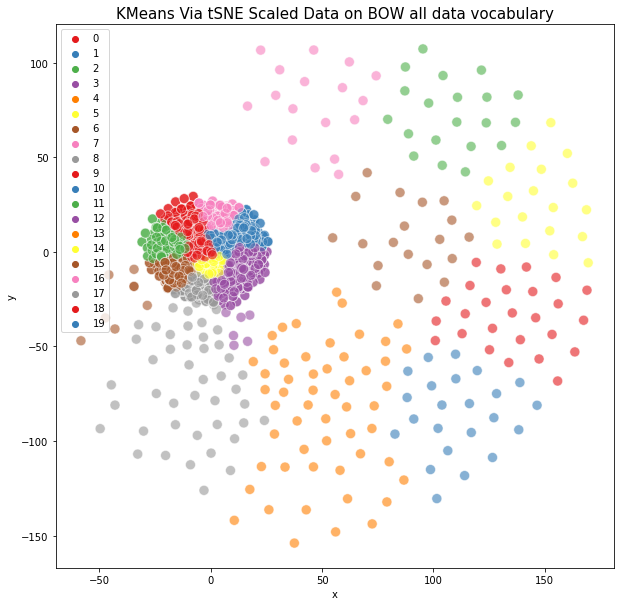

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import seaborn as sns

max_items = np.random.choice(range(BOW_all_data.shape[0]), size=6000, replace=False)

tsne_all_data = TSNE(n_components=2, n_iter=5000, perplexity=100.0, early_exaggeration=15.0)
tsne_bow_all_data = tsne_all_data.fit_transform(BOW_all_data[max_items,:].todense())
tsne_bow_df_all_data = pd.DataFrame(data=tsne_bow_all_data, columns=["x", "y"])

kmeans_bow_tsne_all_data = KMeans(n_clusters=20, init='k-means++', max_iter=100, n_init=30) 
bow_tsne_all_data = kmeans_bow_tsne_all_data.fit(tsne_bow_df_all_data)
bow_all_data_tsne_labels=bow_tsne_all_data.labels_.tolist()


clusters_tsne_bow_all_data = pd.concat([tsne_bow_df_all_data, pd.DataFrame({'tsne_clusters':bow_all_data_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_bow_all_data.iloc[:,0],clusters_tsne_bow_all_data.iloc[:,1],hue=bow_all_data_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on BOW all data vocabulary', fontsize=15)
#centroids=doc2vec_tsne_alldata.cluster_centers_
#centroidpoint=tsne_all_data.fit_transform(centroids)
#sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

Visualization Of BOW Model On Some Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


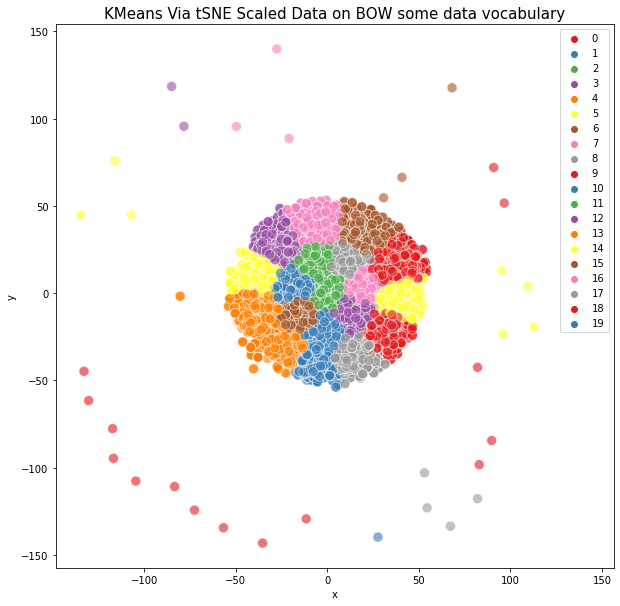

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import seaborn as sns

tsne_some_data = TSNE(n_components=2, n_iter=5000, perplexity=100.0, early_exaggeration=15.0)
tsne_bow_some_data = tsne_some_data.fit_transform(BOW_some_data.todense())
tsne_bow_df_some_data = pd.DataFrame(data=tsne_bow_some_data, columns=["x", "y"])

kmeans_bow_tsne_some_data = KMeans(n_clusters=20, init='k-means++', max_iter=100) 
bow_tsne_some_data = kmeans_bow_tsne_some_data.fit(tsne_bow_df_some_data)
bow_some_data_tsne_labels=bow_tsne_some_data.labels_.tolist()


clusters_tsne_bow_some_data = pd.concat([tsne_bow_df_some_data, pd.DataFrame({'tsne_clusters':bow_some_data_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_bow_some_data.iloc[:,0],clusters_tsne_bow_some_data.iloc[:,1],hue=bow_some_data_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on BOW some data vocabulary', fontsize=15)
# centroids=bow_tsne_some_data.cluster_centers_
# centroidpoint=tsne_some_data.fit_transform(centroids).tolist()
# sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

#TFIDF models -
https://stackoverflow.com/questions/50933591/how-to-perform-kmean-clustering-from-gensim-tfidf-values

In [ ]:
#Creating TFIDF Model for All Words Vocabulary
from sklearn.feature_extraction.text import TfidfVectorizer
vocabulary_all_data_tfidf = TfidfVectorizer()
TFIDF_all_data = vocabulary_all_data_tfidf.fit_transform(corpusWithSentences)

In [ ]:
#Creating TFIDF Model for 2K Words Vocabulary
from sklearn.feature_extraction.text import TfidfVectorizer
vocabulary_some_data_tfidf = TfidfVectorizer(max_features=2000)
TFIDF_some_data = vocabulary_some_data_tfidf.fit_transform(corpusWithSentences)

Visualization Of TFIDF Model On All Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


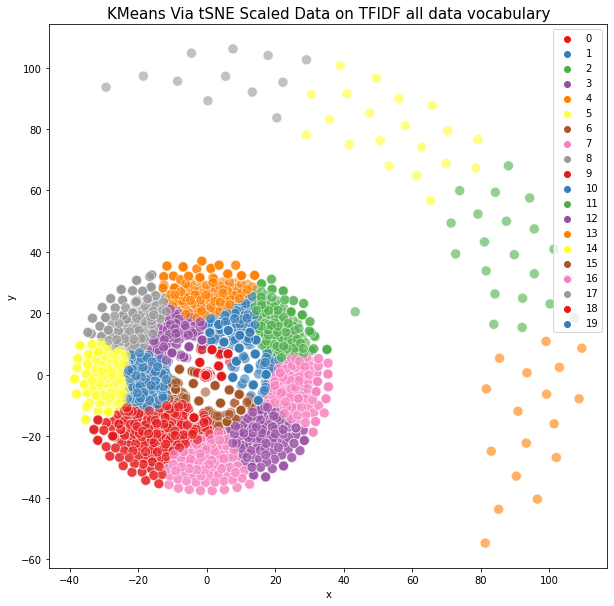

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import seaborn as sns

max_items = np.random.choice(range(TFIDF_all_data.shape[0]), size=6000, replace=False)

tsne_all_data_tfidf = TSNE(n_components=2, n_iter=5000, perplexity=100.0, early_exaggeration=15.0)
tsne_tfidf_all_data = tsne_all_data_tfidf.fit_transform(TFIDF_all_data[max_items,:].todense())
tsne_tfidf_df_all_data = pd.DataFrame(data=tsne_tfidf_all_data, columns=["x", "y"])

kmeans_tfidf_tsne_all_data = KMeans(n_clusters=20, init='k-means++', max_iter=100) 
tfidf_tsne_all_data = kmeans_tfidf_tsne_all_data.fit(tsne_tfidf_df_all_data)
tfidf_all_data_tsne_labels=tfidf_tsne_all_data.labels_.tolist()


clusters_tsne_tfidf_all_data = pd.concat([tsne_tfidf_df_all_data, pd.DataFrame({'tsne_clusters':tfidf_all_data_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_tfidf_all_data.iloc[:,0],clusters_tsne_tfidf_all_data.iloc[:,1],hue=tfidf_all_data_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on TFIDF all data vocabulary', fontsize=15)
# centroids=tfidf_tsne_all_data.cluster_centers_
# centroidpoint=tsne_all_data_tfidf.fit_transform(centroids)
# sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

Visualization Of TFIDF Model On Some Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


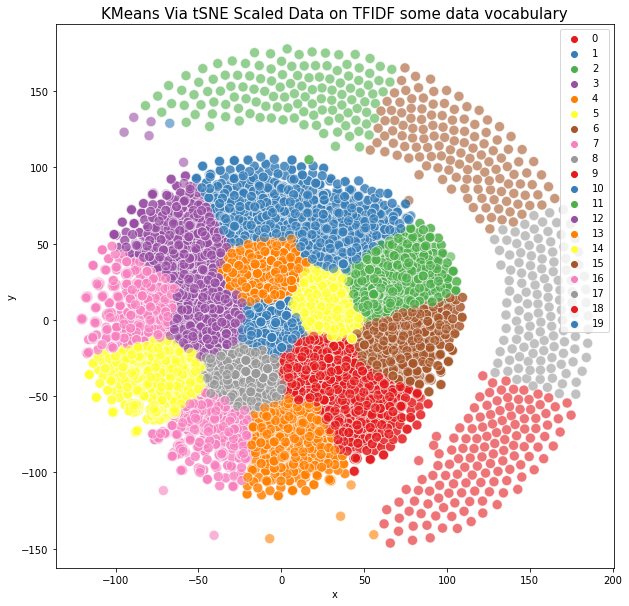

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import seaborn as sns

#max_items = np.random.choice(range(TFIDF_some_data.shape[0]), size=4000, replace=False)

tsne_some_data_tfidf = TSNE(n_components=2, n_iter=3000, perplexity=100.0, early_exaggeration=15.0)
tsne_tfidf_some_data = tsne_some_data_tfidf.fit_transform(TFIDF_some_data.todense())
tsne_tfidf_df_some_data = pd.DataFrame(data=tsne_tfidf_some_data, columns=["x", "y"])

kmeans_tfidf_tsne_some_data = KMeans(n_clusters=20, init='k-means++', max_iter=100) 
tfidf_tsne_some_data = kmeans_tfidf_tsne_some_data.fit(tsne_tfidf_df_some_data)
tfidf_some_data_tsne_labels=tfidf_tsne_some_data.labels_.tolist()


clusters_tsne_tfidf_some_data = pd.concat([tsne_tfidf_df_some_data, pd.DataFrame({'tsne_clusters':tfidf_some_data_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_tfidf_some_data.iloc[:,0],clusters_tsne_tfidf_some_data.iloc[:,1],hue=tfidf_some_data_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on TFIDF some data vocabulary', fontsize=15)
# centroids=tsne_some_data_tfidf.cluster_centers_
# centroidpoint=tsne_some_data_tfidf.fit_transform(centroids)
# sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

#LDA MODELS

In [ ]:
#Creating LDA Model for All Words Vocabulary
import gensim
import gensim.corpora as corpora
vocabulary_all_data_ldamodel = corpora.Dictionary(corpus)
bow_all_data_ldamodel = [vocabulary_all_data_ldamodel.doc2bow(text) for text in corpus]
ldamodel_all_data = gensim.models.ldamodel.LdaModel(bow_all_data_ldamodel, id2word=vocabulary_all_data_ldamodel, num_topics=20, passes=20, minimum_probability=0)
bow_all_data_ldamodel_array = np.array([[y for (x,y) in ldamodel_all_data[bow_all_data_ldamodel[i]]] for i in range(len(bow_all_data_ldamodel))])

In [ ]:
#Creating LDA Model for 2K Words Vocabulary
import gensim
import gensim.corpora as corpora
vocabulary_some_data_ldamodel = corpora.Dictionary(corpus)
vocabulary_some_data_ldamodel.filter_extremes(keep_n=2000)
bow_some_data_ldamodel = [vocabulary_some_data_ldamodel.doc2bow(text) for text in corpus]
ldamodel_some_data = gensim.models.ldamodel.LdaModel(bow_some_data_ldamodel, id2word=vocabulary_some_data_ldamodel, num_topics=20, passes=20, minimum_probability=0)
bow_some_data_ldamodel_array = np.array([[y for (x,y) in ldamodel_some_data[bow_some_data_ldamodel[i]]] for i in range(len(bow_some_data_ldamodel))])

Visualization Of LDA Model On All Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


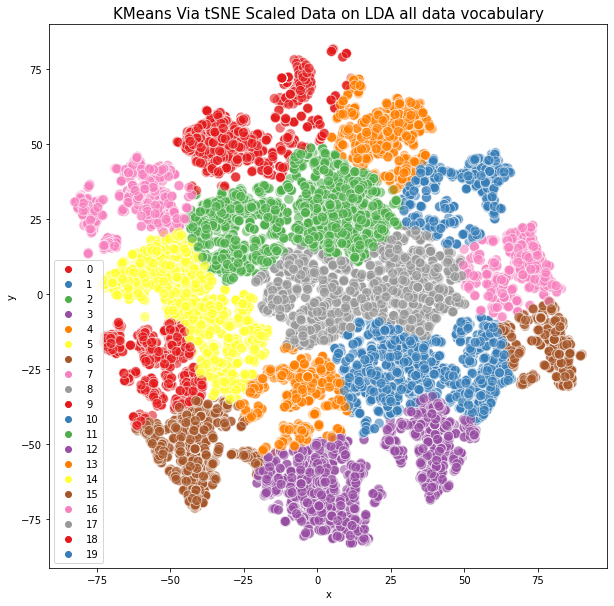

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import seaborn as sns

tsne_all_data_lda = TSNE(random_state=2017, perplexity=30, early_exaggeration=120)
tsne_lda_all_data = tsne_all_data_lda.fit_transform(bow_all_data_ldamodel_array)
tsne_lda_df_all_data = pd.DataFrame(tsne_lda_all_data, columns=['x','y'])


kmeans_lda_tsne_all_data = KMeans(n_clusters=20, init='k-means++', max_iter=100) 
lda_tsne_all_data = kmeans_lda_tsne_all_data.fit(tsne_lda_df_all_data)
lda_all_data_tsne_labels=lda_tsne_all_data.labels_.tolist()

clusters_tsne_lda_all_data = pd.concat([tsne_lda_df_all_data, pd.DataFrame({'tsne_clusters':lda_all_data_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_lda_all_data.iloc[:,0],clusters_tsne_lda_all_data.iloc[:,1],hue=lda_all_data_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on LDA all data vocabulary', fontsize=15)
#centroids=doc2vec_tsne_alldata.cluster_centers_
#centroidpoint=tsne.fit_transform(centroids)
#sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

Visualization Of LDA Model On Some Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


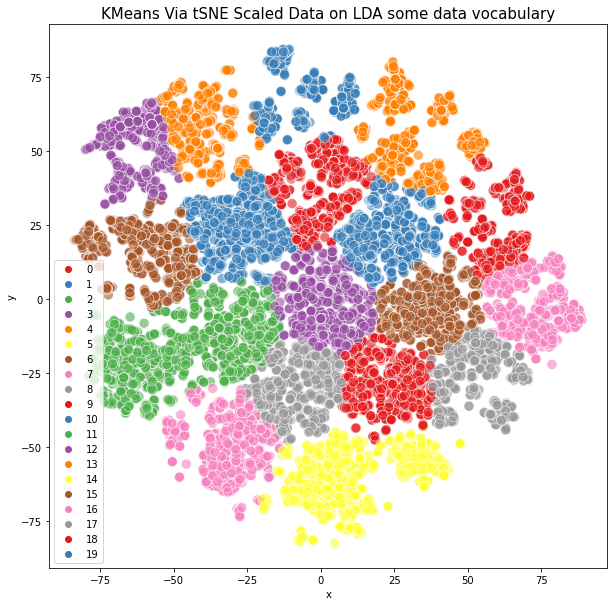

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import seaborn as sns

tsne_some_data_lda = TSNE(random_state=2017, perplexity=30, early_exaggeration=120)
tsne_lda_some_data = tsne_some_data_lda.fit_transform(bow_some_data_ldamodel_array)
tsne_lda_df_some_data = pd.DataFrame(tsne_lda_some_data, columns=['x','y'])


kmeans_lda_tsne_some_data = KMeans(n_clusters=20, init='k-means++', max_iter=100) 
lda_tsne_some_data = kmeans_lda_tsne_some_data.fit(tsne_lda_df_some_data)
lda_some_data_tsne_labels=lda_tsne_some_data.labels_.tolist()

clusters_tsne_lda_some_data = pd.concat([tsne_lda_df_some_data, pd.DataFrame({'tsne_clusters':lda_some_data_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_lda_some_data.iloc[:,0],clusters_tsne_lda_some_data.iloc[:,1],hue=lda_some_data_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on LDA some data vocabulary', fontsize=15)
#centroids=doc2vec_tsne_alldata.cluster_centers_
#centroidpoint=tsne.fit_transform(centroids)
#sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

#DOC2VEC MODELS -
https://medium.com/@ermolushka/text-clusterization-using-python-and-doc2vec-8c499668fa61

In [ ]:
#Creating DOC2VEC Model for All Words Vocabulary
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
doc2vec_all_data = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus)]
doc2vec_model_all_data = Doc2Vec(window=5, min_count=1, workers=4)
doc2vec_model_all_data.build_vocab(doc2vec_all_data)
doc2vec_model_all_data.train(doc2vec_all_data, total_examples=len(doc2vec_all_data), epochs=10)

In [ ]:
#Creating DOC2VEC Model for 2K Words Vocabulary
doc2vec_some_data = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus)]
doc2vec_model_some_data = Doc2Vec(window=7, min_count=130, workers=4)
doc2vec_model_some_data.build_vocab(doc2vec_some_data)
doc2vec_model_some_data.train(doc2vec_some_data, total_examples=len(doc2vec_some_data), epochs=50)

Visualization Of DOC2VEC Model On All Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


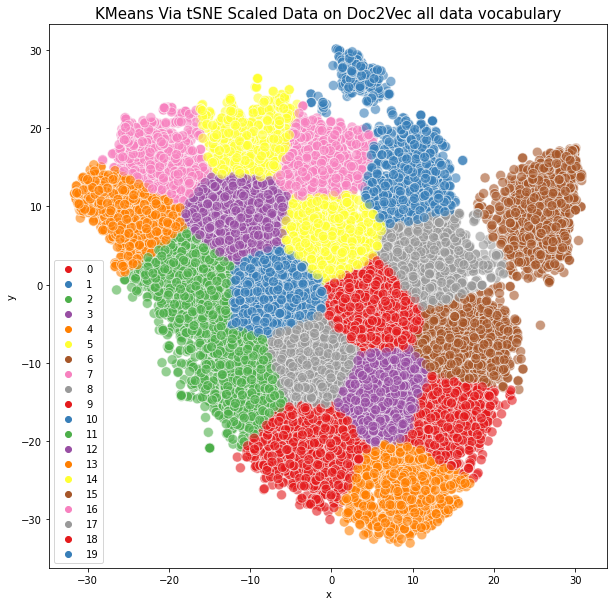

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as mcolors
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
tsne_alldata = TSNE(n_components=2, n_iter=7000, perplexity=200.0, early_exaggeration=20.0)
tsne_d2v_alldata = tsne_alldata.fit_transform(doc2vec_model_all_data.docvecs.vectors_docs)
tsne_d2v_df_alldata = pd.DataFrame(data=tsne_d2v_alldata, columns=["x", "y"])

kmeans_doc2vec_tsne_alldata = KMeans(n_clusters=20, init='k-means++', max_iter=100) 
doc2vec_tsne_alldata = kmeans_doc2vec_tsne_alldata.fit(tsne_d2v_df_alldata)
doc2vec_all_tsne_labels=doc2vec_tsne_alldata.labels_.tolist()

clusters_tsne_doc2vec_alldata = pd.concat([tsne_d2v_df_alldata, pd.DataFrame({'tsne_clusters':doc2vec_all_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_doc2vec_alldata.iloc[:,0],clusters_tsne_doc2vec_alldata.iloc[:,1],hue=doc2vec_all_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on Doc2Vec all data vocabulary', fontsize=15)
#centroids=doc2vec_tsne_alldata.cluster_centers_
#centroidpoint=tsne.fit_transform(centroids)
#sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

Visualization Of DOC2VEC Model On Some Data Vocabulary

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


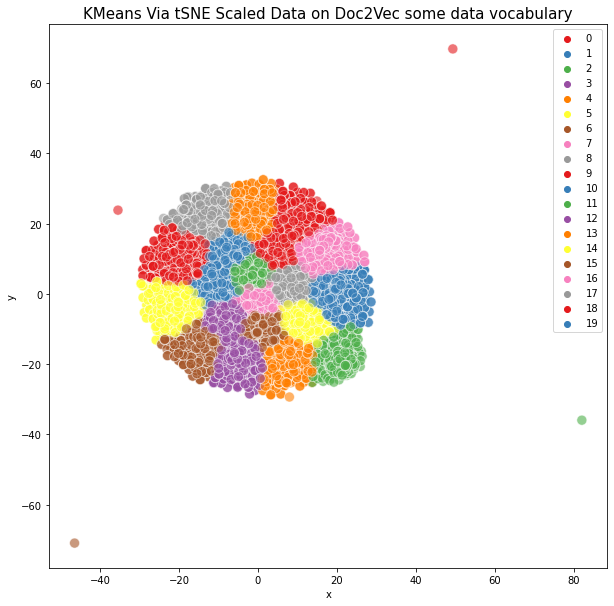

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
tsne_somedata = TSNE(n_components=2, n_iter=3000, perplexity=100.0, early_exaggeration=15.0)
tsne_d2v_somedata = tsne_somedata.fit_transform(doc2vec_model_some_data.docvecs.vectors_docs)
tsne_d2v_df_somedata = pd.DataFrame(data=tsne_d2v_somedata, columns=["x", "y"])

kmeans_doc2vec_tsne_somedata = KMeans(n_clusters=20, init='k-means++', max_iter=100) 
doc2vec_tsne_somedata = kmeans_doc2vec_tsne_somedata.fit(tsne_d2v_df_somedata)
doc2vec_some_tsne_labels=doc2vec_tsne_somedata.labels_.tolist()

import seaborn as sns
clusters_tsne_doc2vec_somedata = pd.concat([tsne_d2v_df_somedata, pd.DataFrame({'tsne_clusters':doc2vec_some_tsne_labels})], axis=1)
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_doc2vec_somedata.iloc[:,0],clusters_tsne_doc2vec_somedata.iloc[:,1],hue=doc2vec_some_tsne_labels, palette='Set1', s=100, alpha=0.6).set_title('KMeans Via tSNE Scaled Data on Doc2Vec some data vocabulary', fontsize=15)
#centroids=doc2vec_tsne_alldata.cluster_centers_
#centroidpoint=tsne.fit_transform(centroids)
#sns.scatterplot(centroidpoint[:, 0], centroidpoint[:, 1], marker='*', s=100, c='#000000',label='centroids')
plt.legend()
plt.show()

#Comparison of NMI values of all models on all words vocabulary

In [ ]:
from sklearn.cluster import KMeans
from sklearn import metrics
print("NMI values for all models on all words vocabulary - ")
#NMI of BOW model of all data vocabulary
kmeans_bow_tsne_all_data = KMeans(n_clusters=20,n_init=30,init='k-means++',max_iter=2000) 
bow_tsne_all_data = kmeans_bow_tsne_all_data.fit(BOW_all_data)
bow_all_data_tsne_labels=bow_tsne_all_data.labels_.tolist()
print("NMI OF BOW MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, bow_all_data_tsne_labels))


# #NMI of TFIDF model of all data vocabulary
kmeans_tfidf_tsne_all_data = KMeans(n_clusters=20,n_init=30,init='k-means++',max_iter=2000) 
tfidf_tsne_all_data = kmeans_tfidf_tsne_all_data.fit(TFIDF_all_data)
tfidf_all_data_tsne_labels=tfidf_tsne_all_data.labels_.tolist()
print("NMI OF TFIDF MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, tfidf_all_data_tsne_labels))


# #NMI of LDA model of all data vocabulary
kmeans_lda_tsne_all_data1 = KMeans(n_clusters=20,n_init=30,init='k-means++',max_iter=2000)  
lda_tsne_all_data1 = kmeans_lda_tsne_all_data1.fit(bow_all_data_ldamodel_array)
lda_all_tsne_labels1=lda_tsne_all_data1.labels_.tolist()
print("NMI OF LDA MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, lda_all_tsne_labels1))


#NMI of DOC2VEC model of all data vocabulary
kmeans_doc2vec_tsne_alldataa = KMeans(n_clusters=20,init='k-means++',max_iter=2000) 
doc2vec_tsne_alldataa = kmeans_doc2vec_tsne_alldata.fit(doc2vec_model_all_data.docvecs.vectors_docs)
doc2vec_all_tssne_labels=doc2vec_tsne_alldataa.labels_.tolist()
print("NMI OF DOC2VEC MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, doc2vec_all_tsne_labels))

NMI values for all models on all words vocabulary - 
NMI OF BOW MODEL: 0.020
NMI OF TFIDF MODEL: 0.262
NMI OF LDA MODEL: 0.295
NMI OF DOC2VEC MODEL: 0.241


#Comparison of NMI values of all models on 2K words vocabulary

In [ ]:
from sklearn.cluster import KMeans
from sklearn import metrics
print("NMI values for all models on 2K words vocabulary - ")
#NMI of BOW model of some data vocabulary
kmeans_bow_tsne_some_data = KMeans(n_clusters=20,n_init=30,init='k-means++',max_iter=2000) 
bow_tsne_some_data = kmeans_bow_tsne_all_data.fit(BOW_some_data)
bow_some_data_tsne_labels=bow_tsne_some_data.labels_.tolist()
print("NMI OF BOW MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, bow_some_data_tsne_labels))


#NMI of TFIDF model of some data vocabulary
kmeans_tfidf_tsne_some_data = KMeans(n_clusters=20, init='k-means++', max_iter=2000) 
tfidf_tsne_some_data = kmeans_tfidf_tsne_some_data.fit(TFIDF_some_data)
tfidf_some_data_tsne_labels=tfidf_tsne_some_data.labels_.tolist()
print("NMI OF TFIDF MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, tfidf_some_data_tsne_labels))


#NMI of LDA model of some data vocabulary
kmeans_lda_tsne_some_data1 = KMeans(n_clusters=20, init='k-means++', max_iter=2000) 
lda_tsne_some_data1 = kmeans_lda_tsne_some_data1.fit(bow_some_data_ldamodel_array)
lda_some_tsne_labels1=lda_tsne_some_data1.labels_.tolist()
print("NMI OF LDA MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, lda_some_tsne_labels1))


#NMI of DOC2VEC model of some data vocabulary
kmeans_doc2vec_tsne_somedata = KMeans(n_clusters=20, init='k-means++', max_iter=2000) 
doc2vec_tsne_somedata = kmeans_doc2vec_tsne_somedata.fit(doc2vec_model_some_data.docvecs.vectors_docs)
doc2vec_some_tsne_labelss=doc2vec_tsne_somedata.labels_.tolist()
print("NMI OF DOC2VEC MODEL: %0.3f"% metrics.normalized_mutual_info_score(newsgroups.target, doc2vec_some_tsne_labels))

NMI values for all models on 2K words vocabulary - 
NMI OF BOW MODEL: 0.009
NMI OF TFIDF MODEL: 0.223
NMI OF LDA MODEL: 0.283
NMI OF DOC2VEC MODEL: 0.179


#Q6 - Do experiment analysis from the following aspects: 1) Impact of different preprocessing ways (e.g., compare the results between two different vocabularies); 2) Impact of different topic numbers; and 3) The clustering performance of different doc. representations. 


#Impact of different topic numbers on all data vocabulary -
https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0

In [ ]:
import gensim
import gensim.corpora as corpora
#Creating LDA Model for All Words Vocabulary with topics=8
vocabulary_all_data_ldamodel1 = corpora.Dictionary(corpus)
bow_all_data_ldamodel1 = [vocabulary_all_data_ldamodel1.doc2bow(text) for text in corpus]
ldamodel_all_data1 = gensim.models.ldamodel.LdaModel(bow_all_data_ldamodel1, id2word=vocabulary_all_data_ldamodel1, num_topics=8, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=14
vocabulary_all_data_ldamodel2 = corpora.Dictionary(corpus)
bow_all_data_ldamodel2 = [vocabulary_all_data_ldamodel2.doc2bow(text) for text in corpus]
ldamodel_all_data2 = gensim.models.ldamodel.LdaModel(bow_all_data_ldamodel2, id2word=vocabulary_all_data_ldamodel2, num_topics=14, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=20
vocabulary_all_data_ldamodel3 = corpora.Dictionary(corpus)
bow_all_data_ldamodel3 = [vocabulary_all_data_ldamodel3.doc2bow(text) for text in corpus]
ldamodel_all_data3 = gensim.models.ldamodel.LdaModel(bow_all_data_ldamodel3, id2word=vocabulary_all_data_ldamodel3, num_topics=20, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=26
vocabulary_all_data_ldamodel4 = corpora.Dictionary(corpus)
bow_all_data_ldamodel4 = [vocabulary_all_data_ldamodel4.doc2bow(text) for text in corpus]
ldamodel_all_data4 = gensim.models.ldamodel.LdaModel(bow_all_data_ldamodel4, id2word=vocabulary_all_data_ldamodel4, num_topics=26, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=33
vocabulary_all_data_ldamodel5 = corpora.Dictionary(corpus)
bow_all_data_ldamodel5 = [vocabulary_all_data_ldamodel5.doc2bow(text) for text in corpus]
ldamodel_all_data5 = gensim.models.ldamodel.LdaModel(bow_all_data_ldamodel5, id2word=vocabulary_all_data_ldamodel5, num_topics=33, passes=20, minimum_probability=0)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

#Comparison of similarity of different topic numbers of same model on all data vocabulary

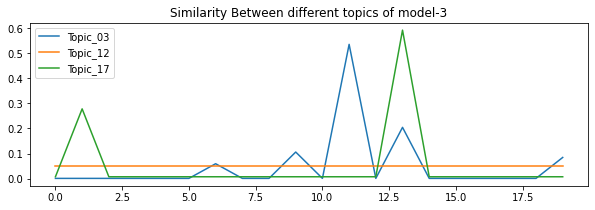


similarity between topics 03 and 17 of model3 -  0.32715937080621516
similarity between topics 17 and 12 of model3 -  0.34095895600817794
similarity between topics 03 and 12 of model3 -  0.37732755611947144


In [ ]:
import pyLDAvis.gensim
vec_lda_17 = vocabulary_all_data_ldamodel3.doc2bow(corpusWithSentences[17].split())
vec_lda_03 = vocabulary_all_data_ldamodel3.doc2bow(corpusWithSentences[3].split())
vec_lda_12 = vocabulary_all_data_ldamodel3.doc2bow(corpusWithSentences[12].split())
vec_lda_topics_17 = ldamodel_all_data3[vec_lda_17]
vec_lda_topics_03 = ldamodel_all_data3[vec_lda_03]
vec_lda_topics_12 = ldamodel_all_data3[vec_lda_12]

import pandas as pd
df1 = pd.DataFrame(vec_lda_topics_03, columns=['topic', 'contrib'])
df1['doc'] = 'doc_03'
df2 = pd.DataFrame(vec_lda_topics_12, columns=['topic', 'contrib'])
df2['doc'] = 'doc_12'
df3 = pd.DataFrame(vec_lda_topics_17, columns=['topic', 'contrib'])
df3['doc'] = 'doc_17'

import matplotlib.pyplot as plt
plt.figure(figsize=[10,3])
plt.plot(df1.topic, df1.contrib)
plt.plot(df2.topic, df2.contrib)
plt.plot(df3.topic, df3.contrib)
plt.legend(['Topic_03', 'Topic_12', 'Topic_17'], loc='upper left')
plt.title("Similarity Between different topics of model-3")
plt.show()

simmilarity_03_17 = gensim.matutils.cossim(vec_lda_topics_03, vec_lda_topics_17)
simmilarity_17_12 = gensim.matutils.cossim(vec_lda_topics_17, vec_lda_topics_12)
simmilarity_03_12 = gensim.matutils.cossim(vec_lda_topics_03, vec_lda_topics_12)

print('\n'+'similarity between topics 03 and 17 of model3 - ', simmilarity_03_17)
print('similarity between topics 17 and 12 of model3 - ', simmilarity_17_12)
print('similarity between topics 03 and 12 of model3 - ', simmilarity_03_12)


#Comparison of similarity of same topic number between different models on all data vocabulary

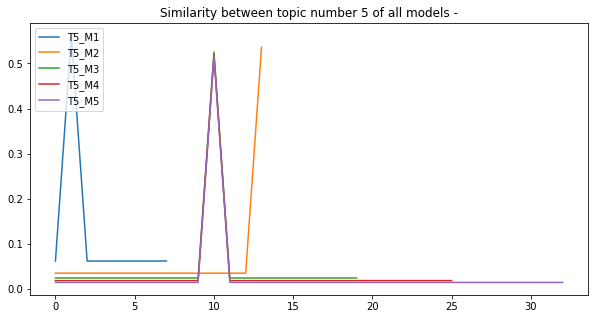

Similarities between topic number 5 -
model1 and model2 -  0.11060280000597958
model1 and model3 -  0.07955636187118356
model1 and model4 -  0.062139555986842517
model1 and model5 -  0.04950460580203415
model2 and model3 -  0.14506901692564544
model2 and model4 -  0.12747366476171007
model2 and model5 -  0.1147186536368825
model3 and model4 -  0.9950228293702729
model5 and model5 -  0.9915550930960896
model4 and model5 -  0.9963634948830113


In [ ]:
import pyLDAvis.gensim
vec_lda_5_1 = vocabulary_all_data_ldamodel1.doc2bow(corpusWithSentences[5].split())
vec_lda_5_2 = vocabulary_all_data_ldamodel2.doc2bow(corpusWithSentences[5].split())
vec_lda_5_3 = vocabulary_all_data_ldamodel3.doc2bow(corpusWithSentences[5].split())
vec_lda_5_4 = vocabulary_all_data_ldamodel4.doc2bow(corpusWithSentences[5].split())
vec_lda_5_5 = vocabulary_all_data_ldamodel5.doc2bow(corpusWithSentences[5].split())

vec_lda_topics_5_1 = ldamodel_all_data1[vec_lda_5_1]
vec_lda_topics_5_2 = ldamodel_all_data2[vec_lda_5_2]
vec_lda_topics_5_3 = ldamodel_all_data3[vec_lda_5_3]
vec_lda_topics_5_4 = ldamodel_all_data4[vec_lda_5_4]
vec_lda_topics_5_5 = ldamodel_all_data5[vec_lda_5_5]

import pandas as pd
df1_1 = pd.DataFrame(vec_lda_topics_5_1, columns=['topic', 'contrib'])
df1_1['doc'] = 'T5_M1'
df2_2 = pd.DataFrame(vec_lda_topics_5_2, columns=['topic', 'contrib'])
df2_2['doc'] = 'T5_M2'
df3_3 = pd.DataFrame(vec_lda_topics_5_3, columns=['topic', 'contrib'])
df3_3['doc'] = 'T5_M3'
df4_4 = pd.DataFrame(vec_lda_topics_5_4, columns=['topic', 'contrib'])
df4_4['doc'] = 'T5_M4'
df5_5 = pd.DataFrame(vec_lda_topics_5_5, columns=['topic', 'contrib'])
df5_5['doc'] = 'T5_M5'

import matplotlib.pyplot as plt

plt.figure(figsize=[10,5])
plt.plot(df1_1.topic, df1_1.contrib)
plt.plot(df2_2.topic, df2_2.contrib)
plt.plot(df3_3.topic, df3_3.contrib)
plt.plot(df4_4.topic, df4_4.contrib)
plt.plot(df5_5.topic, df5_5.contrib)
plt.legend(['T5_M1', 'T5_M2', 'T5_M3','T5_M4','T5_M5'], loc='upper left')
plt.title("Similarity between topic number 5 of all models -")
plt.show()

simmilarity_05_1_05_2 = gensim.matutils.cossim(vec_lda_topics_5_1, vec_lda_topics_5_2)
simmilarity_05_1_05_3 = gensim.matutils.cossim(vec_lda_topics_5_1, vec_lda_topics_5_3)
simmilarity_05_1_05_4 = gensim.matutils.cossim(vec_lda_topics_5_1, vec_lda_topics_5_4)
simmilarity_05_1_05_5 = gensim.matutils.cossim(vec_lda_topics_5_1, vec_lda_topics_5_5)

simmilarity_05_2_05_3 = gensim.matutils.cossim(vec_lda_topics_5_2, vec_lda_topics_5_3)
simmilarity_05_2_05_4 = gensim.matutils.cossim(vec_lda_topics_5_2, vec_lda_topics_5_4)
simmilarity_05_2_05_5 = gensim.matutils.cossim(vec_lda_topics_5_2, vec_lda_topics_5_5)

simmilarity_05_3_05_4 = gensim.matutils.cossim(vec_lda_topics_5_3, vec_lda_topics_5_4)
simmilarity_05_3_05_5 = gensim.matutils.cossim(vec_lda_topics_5_3, vec_lda_topics_5_5)

simmilarity_05_4_05_5 = gensim.matutils.cossim(vec_lda_topics_5_4, vec_lda_topics_5_5)

print("Similarities between topic number 5 -")
print('model1 and model2 - ', simmilarity_05_1_05_2)
print('model1 and model3 - ', simmilarity_05_1_05_3)
print('model1 and model4 - ', simmilarity_05_1_05_4)
print('model1 and model5 - ', simmilarity_05_1_05_5)
print('model2 and model3 - ', simmilarity_05_2_05_3)
print('model2 and model4 - ', simmilarity_05_2_05_4)
print('model2 and model5 - ', simmilarity_05_2_05_5)
print('model3 and model4 - ', simmilarity_05_3_05_4)
print('model5 and model5 - ', simmilarity_05_3_05_5)
print('model4 and model5 - ', simmilarity_05_4_05_5)

#Impact of different topic numbers on some data vocabulary

In [ ]:
import gensim
import gensim.corpora as corpora
#Creating LDA Model for All Words Vocabulary with topics=8
vocabulary_some_data_ldamodel1 = corpora.Dictionary(corpus)
vocabulary_some_data_ldamodel1.filter_extremes(keep_n=2000)
bow_some_data_ldamodel1 = [vocabulary_some_data_ldamodel1.doc2bow(text) for text in corpus]
ldamodel_some_data1 = gensim.models.ldamodel.LdaModel(bow_some_data_ldamodel1, id2word=vocabulary_some_data_ldamodel1, num_topics=8, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=14
vocabulary_some_data_ldamodel2 = corpora.Dictionary(corpus)
vocabulary_some_data_ldamodel2.filter_extremes(keep_n=2000)
bow_some_data_ldamodel2 = [vocabulary_some_data_ldamodel2.doc2bow(text) for text in corpus]
ldamodel_some_data2 = gensim.models.ldamodel.LdaModel(bow_some_data_ldamodel2, id2word=vocabulary_some_data_ldamodel2, num_topics=14, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=20
vocabulary_some_data_ldamodel3 = corpora.Dictionary(corpus)
vocabulary_some_data_ldamodel3.filter_extremes(keep_n=2000)
bow_some_data_ldamodel3 = [vocabulary_some_data_ldamodel3.doc2bow(text) for text in corpus]
ldamodel_some_data3 = gensim.models.ldamodel.LdaModel(bow_some_data_ldamodel3, id2word=vocabulary_some_data_ldamodel3, num_topics=20, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=26
vocabulary_some_data_ldamodel4 = corpora.Dictionary(corpus)
vocabulary_some_data_ldamodel4.filter_extremes(keep_n=2000)
bow_some_data_ldamodel4 = [vocabulary_some_data_ldamodel4.doc2bow(text) for text in corpus]
ldamodel_some_data4 = gensim.models.ldamodel.LdaModel(bow_some_data_ldamodel4, id2word=vocabulary_some_data_ldamodel4, num_topics=26, passes=20, minimum_probability=0)

#Creating LDA Model for All Words Vocabulary with topics=33
vocabulary_some_data_ldamodel5 = corpora.Dictionary(corpus)
vocabulary_some_data_ldamodel5.filter_extremes(keep_n=2000)
bow_some_data_ldamodel5 = [vocabulary_some_data_ldamodel5.doc2bow(text) for text in corpus]
ldamodel_some_data5 = gensim.models.ldamodel.LdaModel(bow_some_data_ldamodel5, id2word=vocabulary_some_data_ldamodel5, num_topics=33, passes=20, minimum_probability=0)

#Comparison of similarity of different topic numbers of same model on some data vocabulary

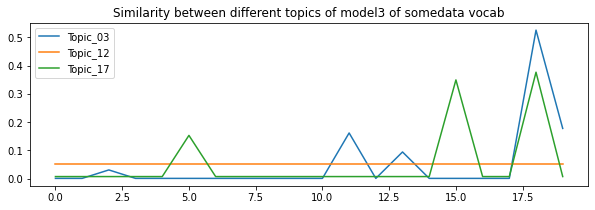


similarity between topics 03 and 17 of model3 -  0.640873952475582
similarity between topics 17 and 12 of model3 -  0.41671575469146066
similarity between topics 03 and 12 of model3 -  0.3815532950168157


In [ ]:
import pyLDAvis.gensim
vec_lda_17s = vocabulary_some_data_ldamodel3.doc2bow(corpusWithSentences[17].split())
vec_lda_03s = vocabulary_some_data_ldamodel3.doc2bow(corpusWithSentences[3].split())
vec_lda_12s = vocabulary_some_data_ldamodel3.doc2bow(corpusWithSentences[12].split())
vec_lda_topics_17s = ldamodel_some_data3[vec_lda_17s]
vec_lda_topics_03s = ldamodel_some_data3[vec_lda_03s]
vec_lda_topics_12s = ldamodel_some_data3[vec_lda_12s]

import pandas as pd
df1s = pd.DataFrame(vec_lda_topics_03s, columns=['topic', 'contrib'])
df1s['doc'] = 'doc_03'
df2s = pd.DataFrame(vec_lda_topics_12s, columns=['topic', 'contrib'])
df2s['doc'] = 'doc_12'
df3s = pd.DataFrame(vec_lda_topics_17s, columns=['topic', 'contrib'])
df3s['doc'] = 'doc_17'

import matplotlib.pyplot as plt
plt.figure(figsize=[10,3])
plt.plot(df1s.topic, df1s.contrib)
plt.plot(df2s.topic, df2s.contrib)
plt.plot(df3s.topic, df3s.contrib)
plt.legend(['Topic_03', 'Topic_12', 'Topic_17'], loc='upper left')
plt.title("Similarity between different topics of model3 of somedata vocab")
plt.show()

simmilarity_03_17s = gensim.matutils.cossim(vec_lda_topics_03s, vec_lda_topics_17s)
simmilarity_17_12s = gensim.matutils.cossim(vec_lda_topics_17s, vec_lda_topics_12s)
simmilarity_03_12s = gensim.matutils.cossim(vec_lda_topics_03s, vec_lda_topics_12s)

print('\n'+'similarity between topics 03 and 17 of model3 - ', simmilarity_03_17s)
print('similarity between topics 17 and 12 of model3 - ', simmilarity_17_12s)
print('similarity between topics 03 and 12 of model3 - ', simmilarity_03_12s)

#Comparison of similarity of same topic number between different models on some data vocabulary

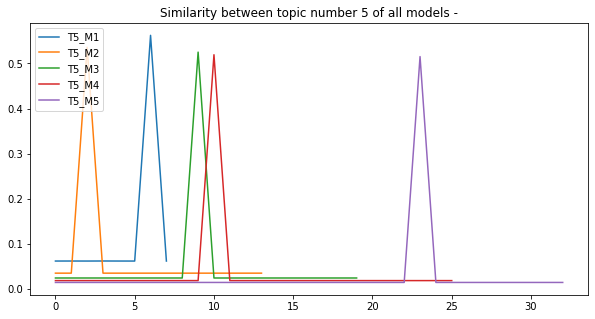

Similarities between topic number 5 -
model1 and model2 -  0.20744036177844097
model1 and model3 -  0.07956447920763993
model1 and model4 -  0.062145888238262524
model1 and model5 -  0.0495096570894401
model2 and model3 -  0.1450692146022082
model2 and model4 -  0.12747389633701817
model2 and model5 -  0.05265772454315711
model3 and model4 -  0.11206741574386696
model5 and model5 -  0.05410942286536702
model4 and model5 -  0.08981006874328742


In [ ]:
import pyLDAvis.gensim
vec_lda_5_1s = vocabulary_some_data_ldamodel1.doc2bow(corpusWithSentences[5].split())
vec_lda_5_2s = vocabulary_some_data_ldamodel2.doc2bow(corpusWithSentences[5].split())
vec_lda_5_3s = vocabulary_some_data_ldamodel3.doc2bow(corpusWithSentences[5].split())
vec_lda_5_4s = vocabulary_some_data_ldamodel4.doc2bow(corpusWithSentences[5].split())
vec_lda_5_5s = vocabulary_some_data_ldamodel5.doc2bow(corpusWithSentences[5].split())

vec_lda_topics_5_1s = ldamodel_some_data1[vec_lda_5_1s]
vec_lda_topics_5_2s = ldamodel_some_data2[vec_lda_5_2s]
vec_lda_topics_5_3s = ldamodel_some_data3[vec_lda_5_3s]
vec_lda_topics_5_4s = ldamodel_some_data4[vec_lda_5_4s]
vec_lda_topics_5_5s = ldamodel_some_data5[vec_lda_5_5s]

import pandas as pd
df1_1s = pd.DataFrame(vec_lda_topics_5_1s, columns=['topic', 'contrib'])
df1_1s['doc'] = 'T5_M1'
df2_2s = pd.DataFrame(vec_lda_topics_5_2s, columns=['topic', 'contrib'])
df2_2s['doc'] = 'T5_M2'
df3_3s = pd.DataFrame(vec_lda_topics_5_3s, columns=['topic', 'contrib'])
df3_3s['doc'] = 'T5_M3'
df4_4s = pd.DataFrame(vec_lda_topics_5_4s, columns=['topic', 'contrib'])
df4_4s['doc'] = 'T5_M4'
df5_5s = pd.DataFrame(vec_lda_topics_5_5s, columns=['topic', 'contrib'])
df5_5s['doc'] = 'T5_M5'

import matplotlib.pyplot as plt

plt.figure(figsize=[10,5])
plt.plot(df1_1s.topic, df1_1s.contrib)
plt.plot(df2_2s.topic, df2_2s.contrib)
plt.plot(df3_3s.topic, df3_3s.contrib)
plt.plot(df4_4s.topic, df4_4s.contrib)
plt.plot(df5_5s.topic, df5_5s.contrib)
plt.legend(['T5_M1', 'T5_M2', 'T5_M3','T5_M4','T5_M5'], loc='upper left')
plt.title("Similarity between topic number 5 of all models -")
plt.show()

simmilarity_05_1_05_2s = gensim.matutils.cossim(vec_lda_topics_5_1s, vec_lda_topics_5_2s)
simmilarity_05_1_05_3s = gensim.matutils.cossim(vec_lda_topics_5_1s, vec_lda_topics_5_3s)
simmilarity_05_1_05_4s = gensim.matutils.cossim(vec_lda_topics_5_1s, vec_lda_topics_5_4s)
simmilarity_05_1_05_5s = gensim.matutils.cossim(vec_lda_topics_5_1s, vec_lda_topics_5_5s)

simmilarity_05_2_05_3s = gensim.matutils.cossim(vec_lda_topics_5_2s, vec_lda_topics_5_3s)
simmilarity_05_2_05_4s = gensim.matutils.cossim(vec_lda_topics_5_2s, vec_lda_topics_5_4s)
simmilarity_05_2_05_5s = gensim.matutils.cossim(vec_lda_topics_5_2s, vec_lda_topics_5_5s)

simmilarity_05_3_05_4s = gensim.matutils.cossim(vec_lda_topics_5_3s, vec_lda_topics_5_4s)
simmilarity_05_3_05_5s = gensim.matutils.cossim(vec_lda_topics_5_3s, vec_lda_topics_5_5s)

simmilarity_05_4_05_5s = gensim.matutils.cossim(vec_lda_topics_5_4s, vec_lda_topics_5_5s)

print("Similarities between topic number 5 -")
print('model1 and model2 - ', simmilarity_05_1_05_2s)
print('model1 and model3 - ', simmilarity_05_1_05_3s)
print('model1 and model4 - ', simmilarity_05_1_05_4s)
print('model1 and model5 - ', simmilarity_05_1_05_5s)
print('model2 and model3 - ', simmilarity_05_2_05_3s)
print('model2 and model4 - ', simmilarity_05_2_05_4s)
print('model2 and model5 - ', simmilarity_05_2_05_5s)
print('model3 and model4 - ', simmilarity_05_3_05_4s)
print('model5 and model5 - ', simmilarity_05_3_05_5s)
print('model4 and model5 - ', simmilarity_05_4_05_5s)

#Impact of different preprocessing ways and The clustering performance of different document representations
https://stats.stackexchange.com/questions/95782/what-are-the-most-common-metrics-for-comparing-two-clustering-algorithms-especi

Calculation of different characteristics to analyze clustering results

In [ ]:
from sklearn import metrics
#BOW on all words vocabulary
print("BOW of all data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, bow_all_data_tsne_labels))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, bow_all_data_tsne_labels))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, bow_all_data_tsne_labels))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(BOW_all_data, bow_all_data_tsne_labels, sample_size=1000) +"\n")

#BOW on some words vocabulary
print("BOW of some data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, bow_some_data_tsne_labels))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, bow_some_data_tsne_labels))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, bow_some_data_tsne_labels))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(BOW_some_data, bow_some_data_tsne_labels, sample_size=1000) + "\n")

#TFIDF on all words vocabulary
print("TFIDF of all data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, tfidf_all_data_tsne_labels))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, tfidf_all_data_tsne_labels))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, tfidf_all_data_tsne_labels))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(TFIDF_all_data, tfidf_all_data_tsne_labels, sample_size=1000) + "\n")

#TFIDF on some words vocabulary
print("TFIDF of some data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, tfidf_some_data_tsne_labels))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, tfidf_some_data_tsne_labels))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, tfidf_some_data_tsne_labels))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(TFIDF_some_data, tfidf_some_data_tsne_labels, sample_size=1000) + "\n")

#LDA on all words vocabulary
print("LDA of all data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, lda_all_tsne_labels1))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, lda_all_tsne_labels1))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, lda_all_tsne_labels1))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(bow_all_data_ldamodel_array, lda_all_tsne_labels1, sample_size=1000) + "\n")

#LDA on some words vocabulary
print("LDA of some data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, lda_some_tsne_labels1))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, lda_some_tsne_labels1))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, lda_some_tsne_labels1))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(bow_some_data_ldamodel_array, lda_some_tsne_labels1, sample_size=1000)+ "\n")

#Doc2Vec on all words vocabulary
print("Doc2Vec of all data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, doc2vec_all_tsne_labels))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, doc2vec_all_tsne_labels))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, doc2vec_all_tsne_labels))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(doc2vec_model_all_data.docvecs.vectors_docs, doc2vec_all_tsne_labels, sample_size=1000)+ "\n")

#Doc2Vec on some words vocabulary
print("Doc2Vec of some data vocab -")
print("Homogeneity: %0.3f" % metrics.homogeneity_score(newsgroups.target, doc2vec_some_tsne_labels))
print("Completeness: %0.3f" % metrics.completeness_score(newsgroups.target, doc2vec_some_tsne_labels))
print("V-measure: %0.3f" % metrics.v_measure_score(newsgroups.target, doc2vec_some_tsne_labels))
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(doc2vec_model_some_data.docvecs.vectors_docs, doc2vec_some_tsne_labels, sample_size=1000))



BOW of all data vocab -
Homogeneity: 0.004
Completeness: 0.154
V-measure: 0.008
Silhouette Coefficient: 0.864

BOW of some data vocab -
Homogeneity: 0.004
Completeness: 0.165
V-measure: 0.009
Silhouette Coefficient: 0.805

TFIDF of all data vocab -
Homogeneity: 0.234
Completeness: 0.312
V-measure: 0.267
Silhouette Coefficient: 0.013

TFIDF of some data vocab -
Homogeneity: 0.201
Completeness: 0.250
V-measure: 0.223
Silhouette Coefficient: 0.012

LDA of all data vocab -
Homogeneity: 0.306
Completeness: 0.311
V-measure: 0.308
Silhouette Coefficient: 0.264

LDA of some data vocab -
Homogeneity: 0.280
Completeness: 0.287
V-measure: 0.283
Silhouette Coefficient: 0.278

Doc2Vec of all data vocab -
Homogeneity: 0.240
Completeness: 0.242
V-measure: 0.241
Silhouette Coefficient: -0.144

Doc2Vec of some data vocab -
Homogeneity: 0.178
Completeness: 0.180
V-measure: 0.179
Silhouette Coefficient: -0.192


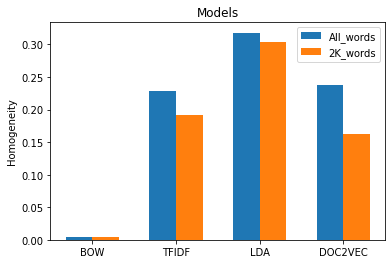

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

labels = ['BOW', 'TFIDF', 'LDA', 'DOC2VEC']
All_data = [0.005, 0.228, 0.318, 0.237]
Some_data = [0.004, 0.191, 0.303, 0.163]
x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, All_data, width, label='All_words')
rects2 = ax.bar(x + width/2, Some_data, width, label='2K_words')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Homogeneity')
ax.set_title('Models')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

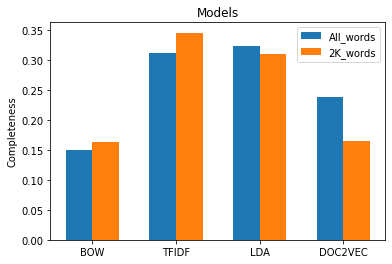

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

labels = ['BOW', 'TFIDF', 'LDA', 'DOC2VEC']
All_data = [0.150, 0.312, 0.323, 0.238]
Some_data = [0.163, 0.346, 0.310, 0.165]
x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, All_data, width, label='All_words')
rects2 = ax.bar(x + width/2, Some_data, width, label='2K_words')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Completeness')
ax.set_title('Models')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

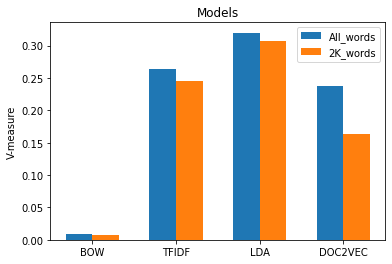

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

labels = ['BOW', 'TFIDF', 'LDA', 'DOC2VEC']
All_data = [0.009, 0.264, 0.320, 0.238]
Some_data = [0.008, 0.246, 0.307, 0.164]
x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, All_data, width, label='All_words')
rects2 = ax.bar(x + width/2, Some_data, width, label='2K_words')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('V-measure')
ax.set_title('Models')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

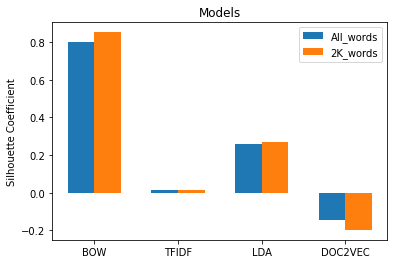

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

labels = ['BOW', 'TFIDF', 'LDA', 'DOC2VEC']
All_data = [0.802, 0.014, 0.260, -0.147]
Some_data = [0.852, 0.013, 0.272, -0.197]
x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

x = np.arange(len(labels))  # the label locations
width = 0.32  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, All_data, width, label='All_words')
rects2 = ax.bar(x + width/2, Some_data, width, label='2K_words')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Silhouette Coefficient')
ax.set_title('Models')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()